# **Physical Therapy Dataset: Regresión**

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,mean_absolute_percentage_error

from sklearn.linear_model import Lasso, Ridge
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR


## **Análisis exploratorio de datos.**

En el estudio fueron icluidos 5 sujetos con los siguientes datos :

1. Mujer de 55 años, peso de 73 kg y estatura de 169 cm
2. Hombre de 61 años, peso de 85 kg y estatura de 180 cm
3. Hombre de 23 años, peso de 95 kg y estatura de 180 cm
4. Mujer de 48 años, peso de 55 kg y estatura de 158 cm
4. Hombre de 53 años, peso de 98 kg y estatura de 175 cm

Para cada sujeto se tomaron mediciones para un total de 8 ejercicios, estas mediciones se tomaron con un total de 5 sensores, si el ejercicio era diseñado para el tren inferior las unidades 1 y 4 se encontraban en la pierna izquiera, las unidades 2 y 3 se encontraban en la pierna derecha y el sensor número 5 se encontraba en el pecho, si por el contrario el ejercicio esta diseñado para el tren superior, el sensor 1 se encontraba en la pierna izquierda, el 2,3 y 4 se encontraban en la mano, brazo y hombro respectivente y el 5 tambien estaba en el pecho.

**Tipos de ejercicio:**

1. Tren inferior
2. Tren superior
3. Tren inferior
4. Tren inferior
5. Tren inferior
6. Tren superior
7. Tren superior
8. Tren superior

Supongamos que se desea examinar el rendimiento de uno de los sujetos en uno de los ejercicios, escogeremos al sujeto 3 en la ejecucion del ejercicio 3, recordemos que este ejercicio es de tren inferior, y analizaremos los resultados obtenidos en cada uno de los 5 sensores.

In [2]:
unidad1 = pd.read_csv("https://raw.githubusercontent.com/nicollF/datosss/refs/heads/main/datos_fisioterapia/template_session_s3e3u1.txt", delimiter=";")
unidad2 = pd.read_csv("https://raw.githubusercontent.com/nicollF/datosss/refs/heads/main/datos_fisioterapia/template_session_s3e3u2.txt", delimiter=";")
unidad3 = pd.read_csv("https://raw.githubusercontent.com/nicollF/datosss/refs/heads/main/datos_fisioterapia/template_session_s3e3u3.txt", delimiter=";")
unidad4 = pd.read_csv("https://raw.githubusercontent.com/nicollF/datosss/refs/heads/main/datos_fisioterapia/template_session_s3e3u4.txt", delimiter=";")
unidad5 = pd.read_csv("https://raw.githubusercontent.com/nicollF/datosss/refs/heads/main/datos_fisioterapia/template_session_s3e3u5.txt", delimiter=";")

In [3]:
unidad1.head()

,time index,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
0,1,0.378989,-5.134503,-8.279289,-0.017742,-0.000990,-0.006992,-0.241422,0.737844,0.774844
1,2,0.393998,-5.127155,-8.264071,0.000441,0.011472,-0.014196,-0.242423,0.737823,0.776039
2,3,0.363986,-5.141877,-8.287035,-0.001453,0.000812,-0.009728,-0.242255,0.739324,0.774925
3,4,0.378989,-5.142026,-8.264365,-0.005154,0.004526,-0.002464,-0.241324,0.739066,0.774551
4,5,0.371510,-5.126997,-8.279395,-0.006933,-0.008118,-0.007064,-0.241393,0.737976,0.775251


In [4]:
unidad1.drop(columns="time index", inplace=True)
unidad2.drop(columns="time index", inplace=True)
unidad3.drop(columns="time index", inplace=True)
unidad4.drop(columns="time index", inplace=True)
unidad5.drop(columns="time index", inplace=True)

In [5]:
unidad1.columns

Index(['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y',
       'mag_z'],
      dtype='object')

Tomando de ejemplo el dataset de la primera unidad del sensor, podemos ver que cada conjunto de datos cunenta con las variables:

- ```acc_x```
- ```acc_y```
- ```acc_z```
- ```gyr_x```
- ```gyr_y```
- ```gyr_z```
- ```mag_x```
- ```mag_y```
- ```mag_z```

In [6]:
unidad1.head()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
0,0.378989,-5.134503,-8.279289,-0.017742,-0.000990,-0.006992,-0.241422,0.737844,0.774844
1,0.393998,-5.127155,-8.264071,0.000441,0.011472,-0.014196,-0.242423,0.737823,0.776039
2,0.363986,-5.141877,-8.287035,-0.001453,0.000812,-0.009728,-0.242255,0.739324,0.774925
3,0.378989,-5.142026,-8.264365,-0.005154,0.004526,-0.002464,-0.241324,0.739066,0.774551
4,0.371510,-5.126997,-8.279395,-0.006933,-0.008118,-0.007064,-0.241393,0.737976,0.775251


De esta manera incluimos nuestras 3 variables de interés y las que serán predichas por los modelos que mas adelante implementaremos, ahora si veamos un análisis exploratorio de cada serie temporal.

### ***Unidad #1***

In [7]:
unidad1.describe()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,0.177227,-6.615294,-7.109566,-0.004637,0.002748,-0.005191,-0.226503,0.872943,0.625797
std,0.221618,0.593591,0.571142,0.144282,0.030253,0.031454,0.024015,0.048770,0.066956
min,-0.543382,-11.415644,-8.617781,-0.764049,-0.316614,-0.146580,-0.273060,0.725685,0.373822
25%,-0.020070,-7.027512,-7.505059,-0.051757,-0.005771,-0.015870,-0.244834,0.839770,0.579136
50%,0.250093,-6.579551,-7.201348,-0.012209,0.003943,-0.005996,-0.231555,0.871351,0.630275
75%,0.340904,-6.205579,-6.738925,0.025369,0.013466,0.004337,-0.205491,0.911462,0.674012
max,0.632975,-4.841111,-4.199216,1.186169,0.132470,0.273335,-0.175576,1.005422,0.799418


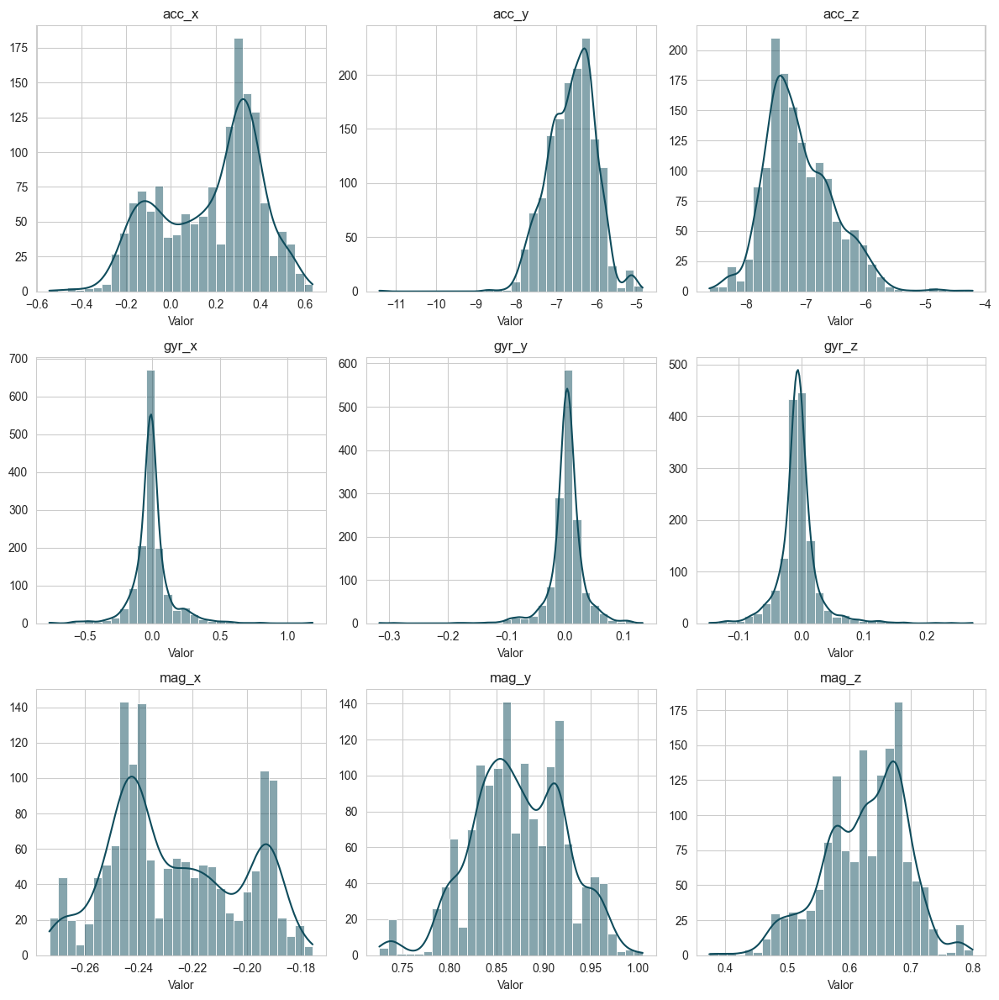

In [8]:
sns.set_style('whitegrid')
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()
for i, var in enumerate(variables):
    sns.histplot(unidad1[var], kde=True, ax=axes[i], bins=30, color='#0F4C5C')
    axes[i].set_title(var)
    axes[i].set_xlabel('Valor')
    axes[i].set_ylabel('')
plt.tight_layout()
plt.show()

En la gráfica presentada aneriormente tenemos las distribuciones de cada una de las mediciones, podemos ver de forma general que en la mayoría de estas mediciones la mediana se encuentra cercana a la media, vemos que por parte de las variables del sensor giroscopiro siguen una distribucion muy parecidad a la normal aunque sin mucha variabilidad en los datos, a diferencia de las mediciones de los otros sensores donde si se observa una mayor variabilidad.

Grafiquemos las series de tiempo.

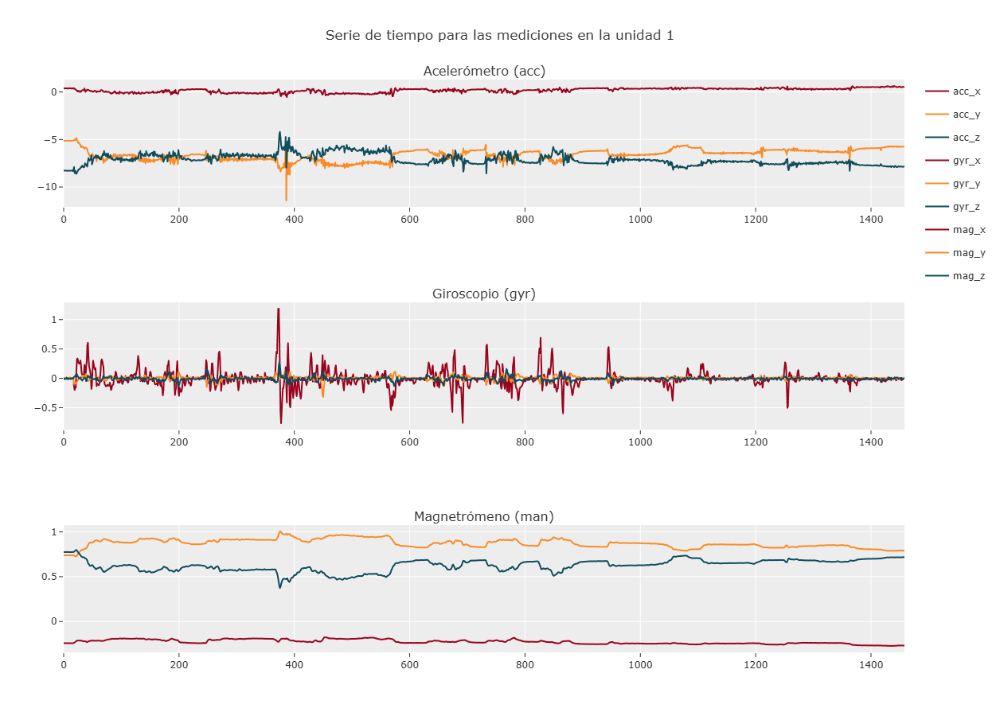

In [9]:
fig = sp.make_subplots(rows=3, cols=1, subplot_titles=['Acelerómetro (acc)', 'Giroscopio (gyr)', 'Magnetrómeno (man)'])
variables = ['acc', 'gyr', 'mag']
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
for i, var in enumerate(variables):
    fig_line = px.line(unidad1,y=[f'{var}_x', f'{var}_y', f'{var}_z'])
    for j, trace in enumerate(fig_line.data):
        trace.line.color = colores[j]
        fig.add_trace(trace, row=i + 1, col=1)

fig.update_layout(height=900, width=900, title_text="Serie de tiempo para las mediciones en la unidad 1",template='ggplot2')
fig.show()

En la gráfica anterior podemos visualizar las mediciones a traves del tiempo, si revisamos las medicones obtenidas por el sensor del ```acc```, parece ser que estas series de tiempo son no estacionarias puesto que tienen una tencencia, luego lo corroboramos al indagar en los gráficos de autocorrelacion y autocorrelacion parcial. Si vemos las mediciones capturadas por el sensor ```gyr```, estas parecen ser estacionarias, puesto que sus gráficas no parecen mostrar una tendencia y por ultimpo, revisando el sensor ```man``` todas sus series parecen ser no estacionarias pero sabemos que estas suposiciones se comprueban con los graficos de **ACF** y **PACF**.

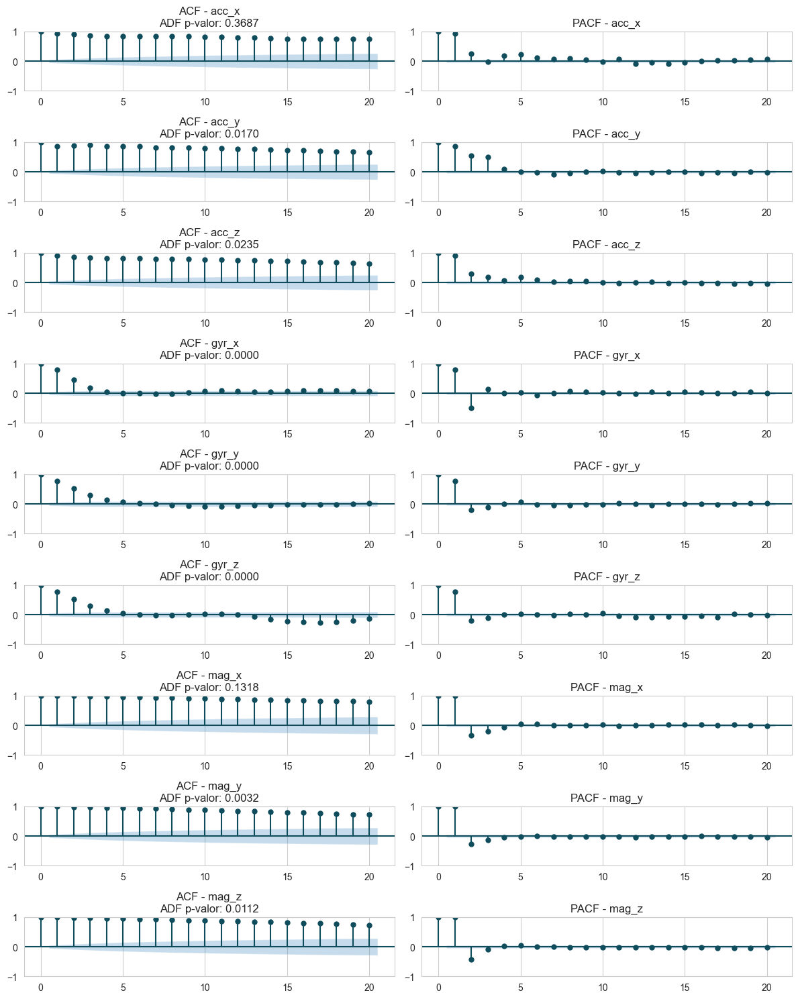

In [10]:
sns.set_style('whitegrid')
fig, axes = plt.subplots(9, 2, figsize=(12, 15))

# Para cada variable, graficamos ACF y PACF
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']

for i, var in enumerate(variables):
    result = adfuller(unidad1[var].dropna())  # Asegurarse de que no haya valores NaN
    p_value = result[1] 
    # Graficar autocorrelación (ACF)
    plot_acf(unidad1[var], lags=20, ax=axes[i, 0], color='#0F4C5C', vlines_kwargs={'color': '#0F4C5C'})
    axes[i, 0].set_title(f'ACF - {var}\nADF p-valor: {p_value:.4f}')
    
    # Graficar autocorrelación parcial (PACF)
    plot_pacf(unidad1[var], lags=20, ax=axes[i, 1], color='#0F4C5C', vlines_kwargs={'color': '#0F4C5C'})
    axes[i, 1].set_title(f'PACF - {var}')

# Ajustar el espacio entre gráficos
plt.tight_layout()
plt.show()

Recordemos las hipotesis para la prueba de Dickey-Fuller aumentada:

$$H_0: \textit{la serie no es estacionaria} $$
$$H_1: \textit{la serie es estacionaria} $$

Siguiendonos de la prueba analítica y ademas de los gráficos de autocorrelacion podemos decir que la serie de tiempo de los sensores ```mag_x``` y ```acc_x``` son las únicas de las 9 variables que tienen una serie de tiempo no estacionaria puesto que su p-valor en la prueba analítica es mayor a 0.05, las demas todas son estacionarias.

Con el resultado anterior podemos analisar como es la descomposicion de estas series que no son estacionarias.

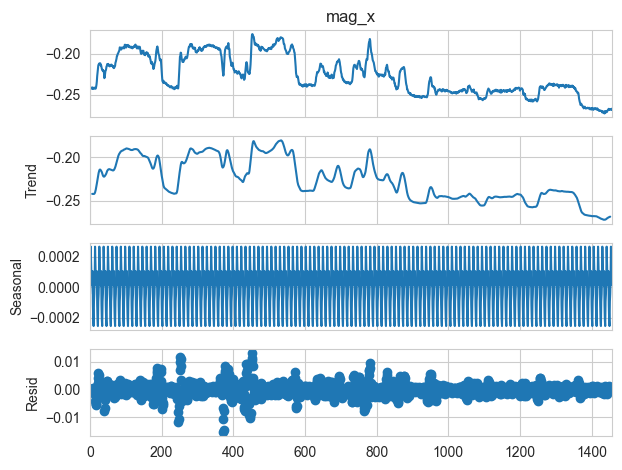

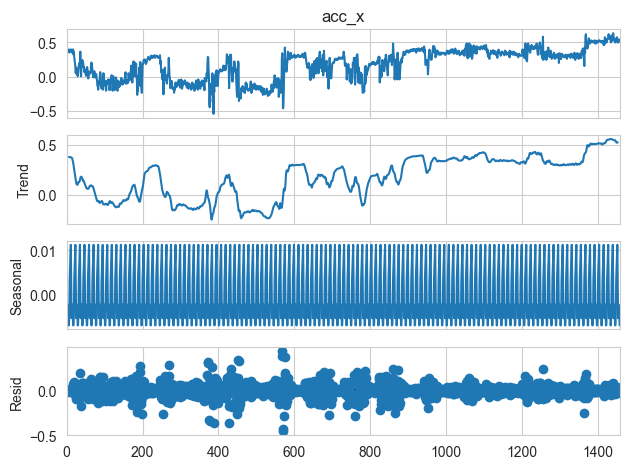

In [11]:
result = seasonal_decompose(unidad1['mag_x'], model='additive', period=12)
result.plot();
result = seasonal_decompose(unidad1['acc_x'], model='additive', period=12)
result.plot();

Mediante las gráficas anteriores podemos ver varios aspectos importantes en las series de tiempo, siendo uno de estos el factor de estacionaridad, que ya sabiendo que estas dos serie no son estacionarias se comprueba aun mas al ver que el factor estacional es muy pequeño y es claro que existe una tendecia a decrecer en la primera y a crecer en la segunda.

### ***Unidad #2***

Analicemos ahora como se comportan las series de tiempo de los datos capturados por el sensor #2, recordemos que este sensor es el que se encuentra en el tobillo derecho.

In [12]:
unidad2.describe()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2.812795,7.785441,-2.806160,0.000708,0.024261,-0.004291,-0.523005,-0.589290,0.238567
std,3.561835,3.148975,1.886743,0.348759,0.173733,0.553186,0.242482,0.386909,0.185571
min,-2.918992,-1.432401,-8.548029,-2.199796,-0.812935,-2.434801,-0.823892,-1.057205,-0.039988
25%,-0.333125,5.786602,-4.223944,-0.075502,-0.013425,-0.057795,-0.807514,-0.949836,0.096875
50%,1.521477,8.397111,-2.288873,0.009595,0.016673,-0.003203,-0.612026,-0.627271,0.175637
75%,6.481032,9.087751,-1.477545,0.119248,0.045696,0.046137,-0.251545,-0.128655,0.360783
max,10.613149,42.813313,1.532048,1.564601,0.795754,2.109093,-0.189443,0.143204,0.721492


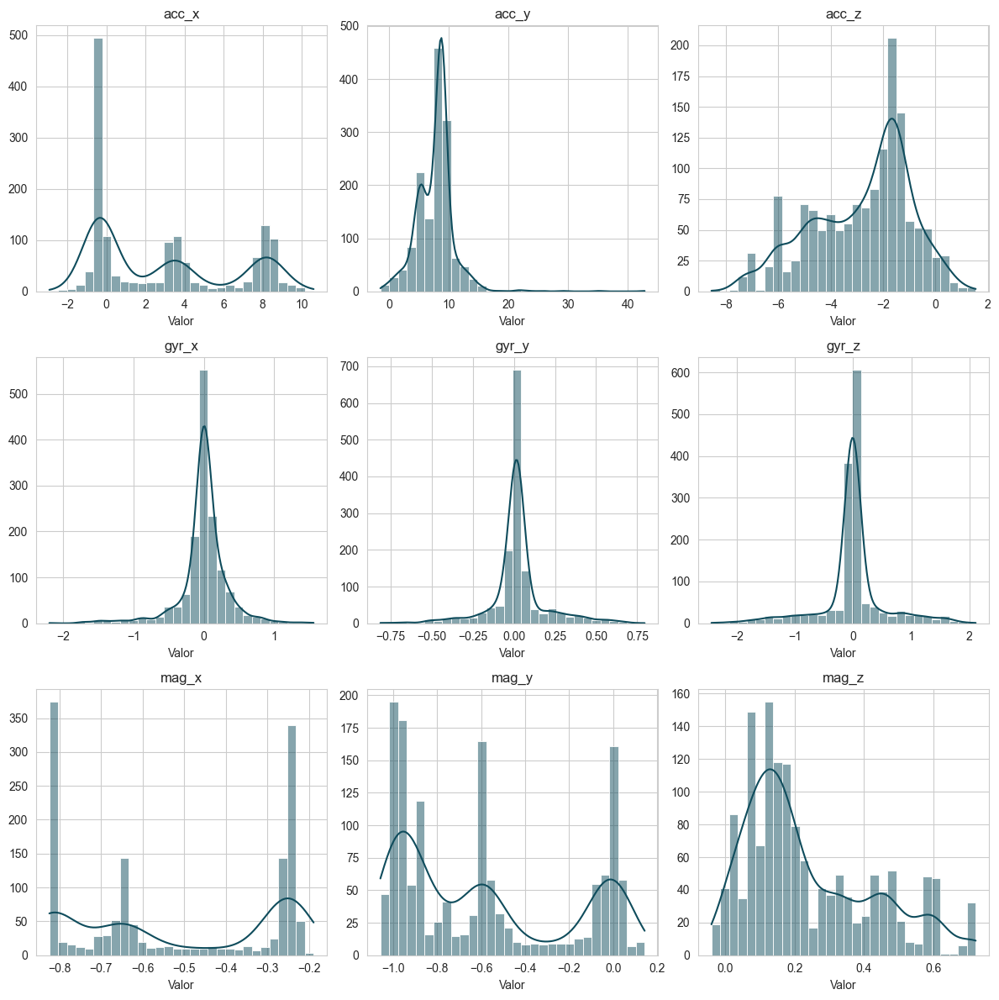

In [13]:
sns.set_style('whitegrid')
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()
for i, var in enumerate(variables):
    sns.histplot(unidad2[var], kde=True, ax=axes[i], bins=30, color='#0F4C5C')
    axes[i].set_title(var)
    axes[i].set_xlabel('Valor')
    axes[i].set_ylabel('')
plt.tight_layout()
plt.show()

Si observamos las distribuciones de este conjunto de variables de este segundo sensor, encontremos mas asimetria por parte del sensor ```mag```, por parte del medidor de ```gyr``` podemos notar el mismo comportamiento que en la unidad anterior.

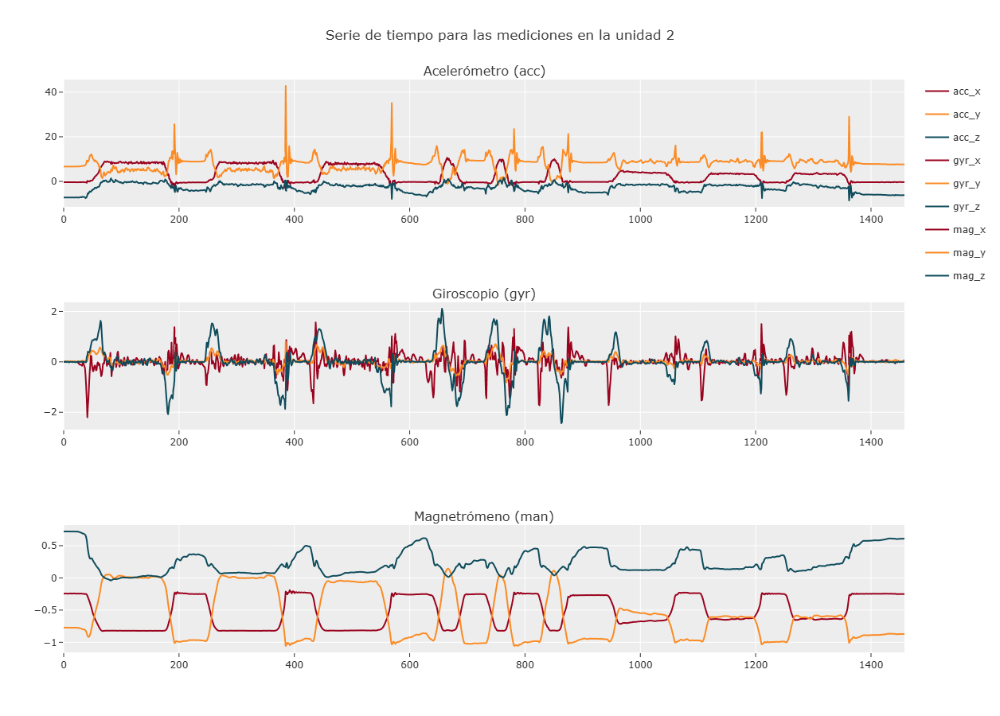

In [14]:
fig = sp.make_subplots(rows=3, cols=1, subplot_titles=['Acelerómetro (acc)', 'Giroscopio (gyr)', 'Magnetrómeno (man)'])
variables = ['acc', 'gyr', 'mag']
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
for i, var in enumerate(variables):
    fig_line = px.line(unidad2,y=[f'{var}_x', f'{var}_y', f'{var}_z'])
    for j, trace in enumerate(fig_line.data):
        trace.line.color = colores[j]
        fig.add_trace(trace, row=i + 1, col=1)

fig.update_layout(height=900, width=900, title_text="Serie de tiempo para las mediciones en la unidad 2",template='ggplot2')
fig.show()

En el gráfico anterior pudimos ver las serie de tiempo de los datos del sensor #2, si detallamos en cada serie por separado gracias a que la gráfica interactiva de plotly lo permite, vemos que cada una de las series son estacionarias, comprobemos esto con los gráficos de autocorrelación y autocorrelación parcial, veamos. 

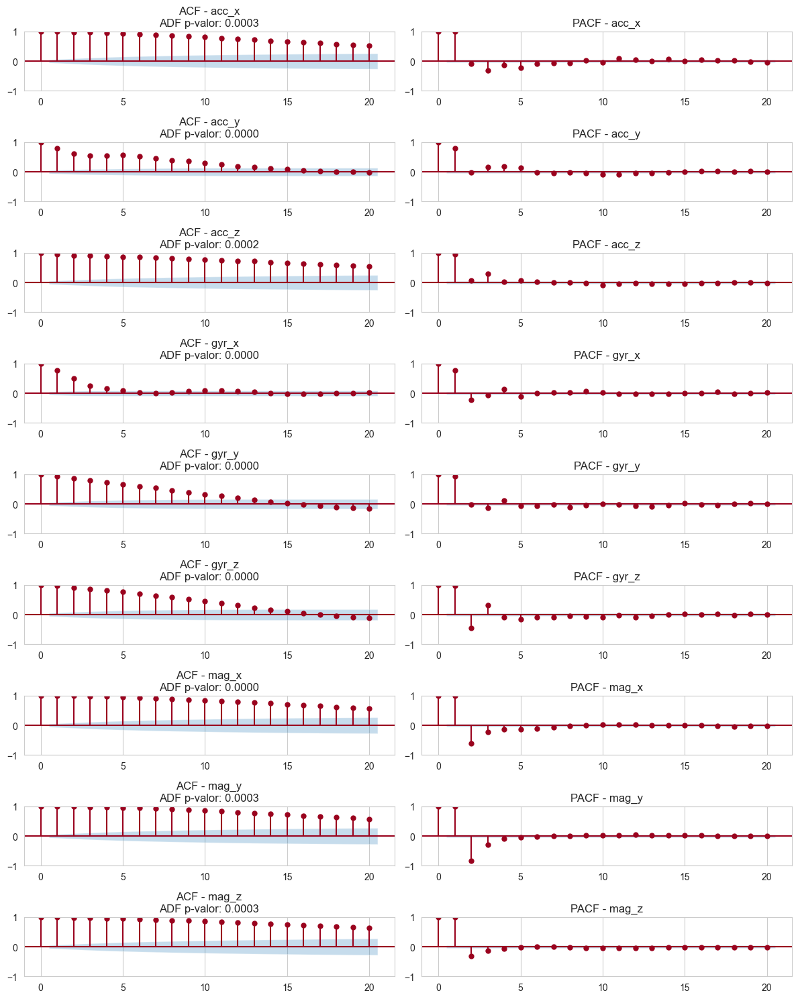

In [15]:
sns.set_style('whitegrid')
fig, axes = plt.subplots(9, 2, figsize=(12, 15))

# Para cada variable, graficamos ACF y PACF
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']

for i, var in enumerate(variables):
    result = adfuller(unidad2[var].dropna())  # Asegurarse de que no haya valores NaN
    p_value = result[1] 
    # Graficar autocorrelación (ACF)
    plot_acf(unidad2[var], lags=20, ax=axes[i, 0], color='#9A031E', vlines_kwargs={'color': '#9A031E'})
    axes[i, 0].set_title(f'ACF - {var}\nADF p-valor: {p_value:.4f}')
    
    # Graficar autocorrelación parcial (PACF)
    plot_pacf(unidad2[var], lags=20, ax=axes[i, 1], color='#9A031E', vlines_kwargs={'color': '#9A031E'})
    axes[i, 1].set_title(f'PACF - {var}')

# Ajustar el espacio entre gráficos
plt.tight_layout()
plt.show()

Como dijimos anteriormente, y como lo corroboran las gráficas de autocorrelacion y autocorrelacion parcial, ademas de las pruebas analíticas, las 9 series de tiempo en el sensor son estacionarias.

### ***Unidad #3***

Repetiremos el mismo proceso que utilizamos para anañisar las tendencias y patrones de las series de tiempo capturadas por cada sensor, veamos como se comportan las mediciones en la unidad 3.

In [16]:
unidad3.describe()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,1.965652,9.637832,1.376139,0.037024,0.003377,-0.043942,-0.597684,-0.371633,0.018458
std,0.703887,0.253250,1.304859,0.253603,0.117539,0.664562,0.147220,0.413208,0.062868
min,0.776601,8.900337,-2.080338,-1.136484,-1.090469,-2.351704,-0.813582,-0.741896,-0.151035
25%,1.345680,9.474040,0.383800,-0.031061,-0.032975,-0.095770,-0.745141,-0.725863,-0.035546
50%,1.697507,9.674122,1.671323,0.045010,-0.003883,-0.047176,-0.668565,-0.493533,0.017326
75%,2.636749,9.750824,2.365322,0.118466,0.020538,-0.009399,-0.436099,0.130472,0.057293
max,3.868101,12.569551,5.546850,2.077212,1.121626,2.420325,-0.412744,0.431893,0.209706


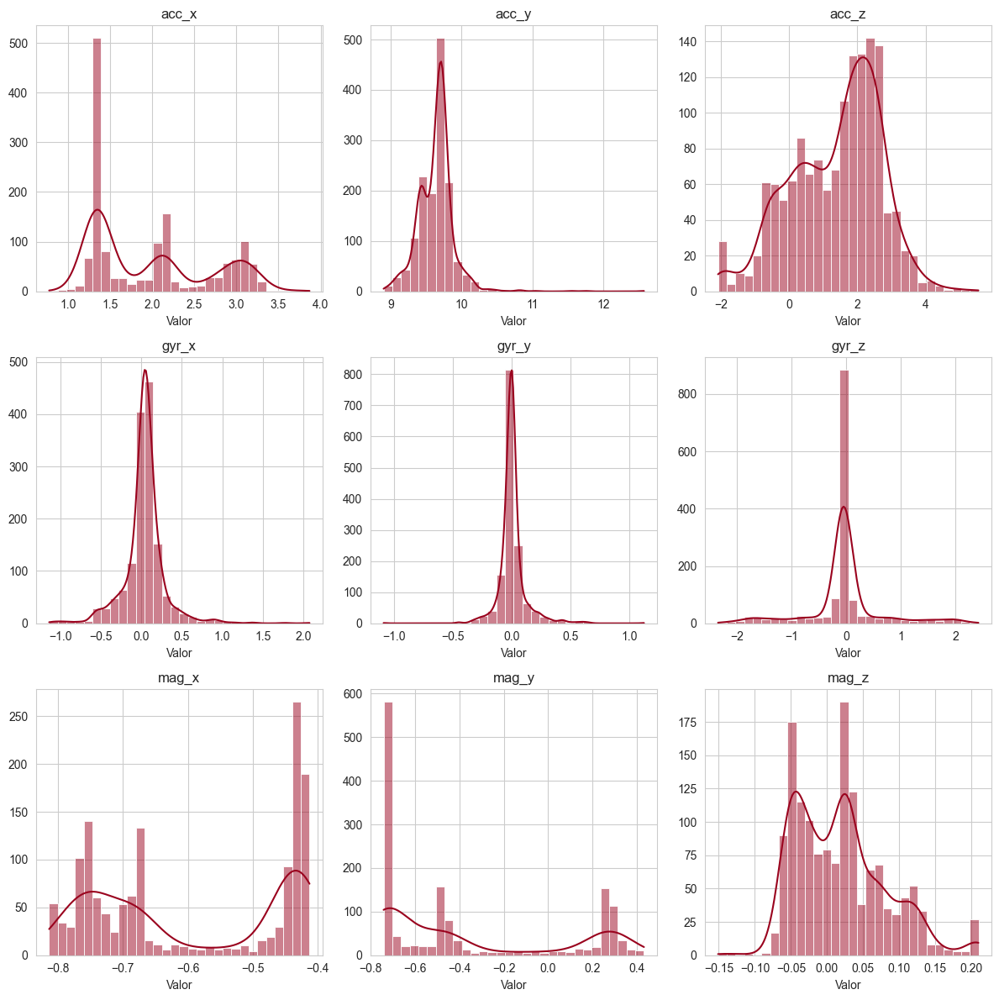

In [17]:
sns.set_style('whitegrid')
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()
for i, var in enumerate(variables):
    sns.histplot(unidad3[var], kde=True, ax=axes[i], bins=30, color='#9A031E')
    axes[i].set_title(var)
    axes[i].set_xlabel('Valor')
    axes[i].set_ylabel('')
plt.tight_layout()
plt.show()

Luego de ver las distribuciones de las variables podemos observar que los comportamientos son muy parecidos, pasemos a observar el comportamiento de cada una de las series de tiempo.

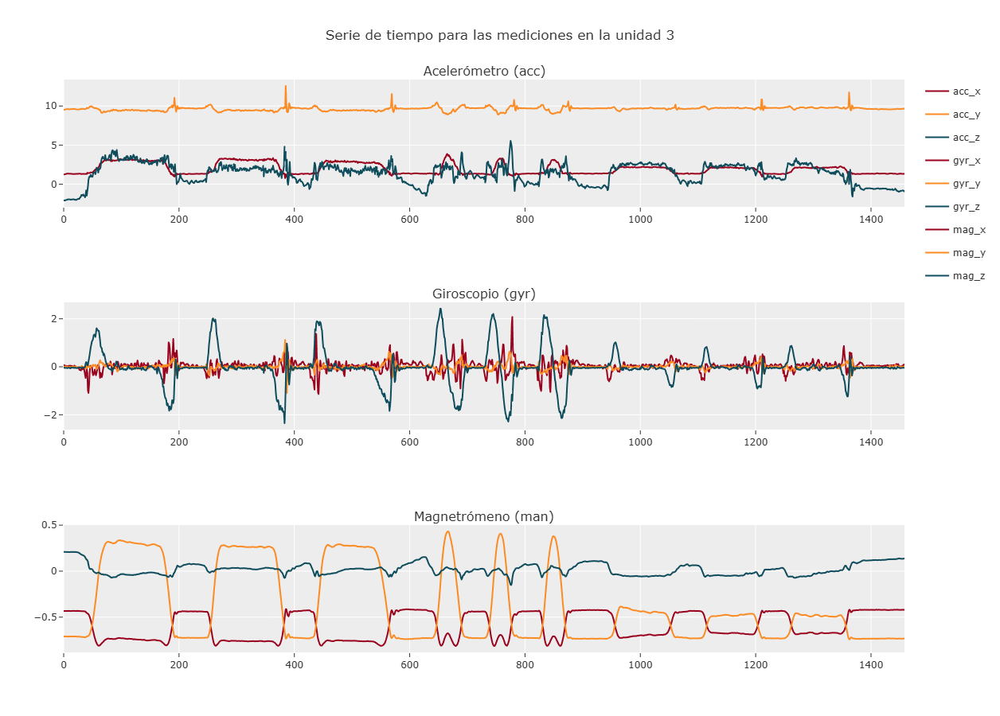

In [18]:
fig = sp.make_subplots(rows=3, cols=1, subplot_titles=['Acelerómetro (acc)', 'Giroscopio (gyr)', 'Magnetrómeno (man)'])
variables = ['acc', 'gyr', 'mag']
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
for i, var in enumerate(variables):
    fig_line = px.line(unidad3,y=[f'{var}_x', f'{var}_y', f'{var}_z'])
    for j, trace in enumerate(fig_line.data):
        trace.line.color = colores[j]
        fig.add_trace(trace, row=i + 1, col=1)

fig.update_layout(height=900, width=900, title_text="Serie de tiempo para las mediciones en la unidad 3",template='ggplot2')
fig.show()

Vemos que estas mediciones parecen seguir una tendencia estacional, esto es mucho mas clara en las observaciones tomadas por el magnetrómetro, veamos las graficas de ACF y PACF con el fin de comprobar estacionaridad.

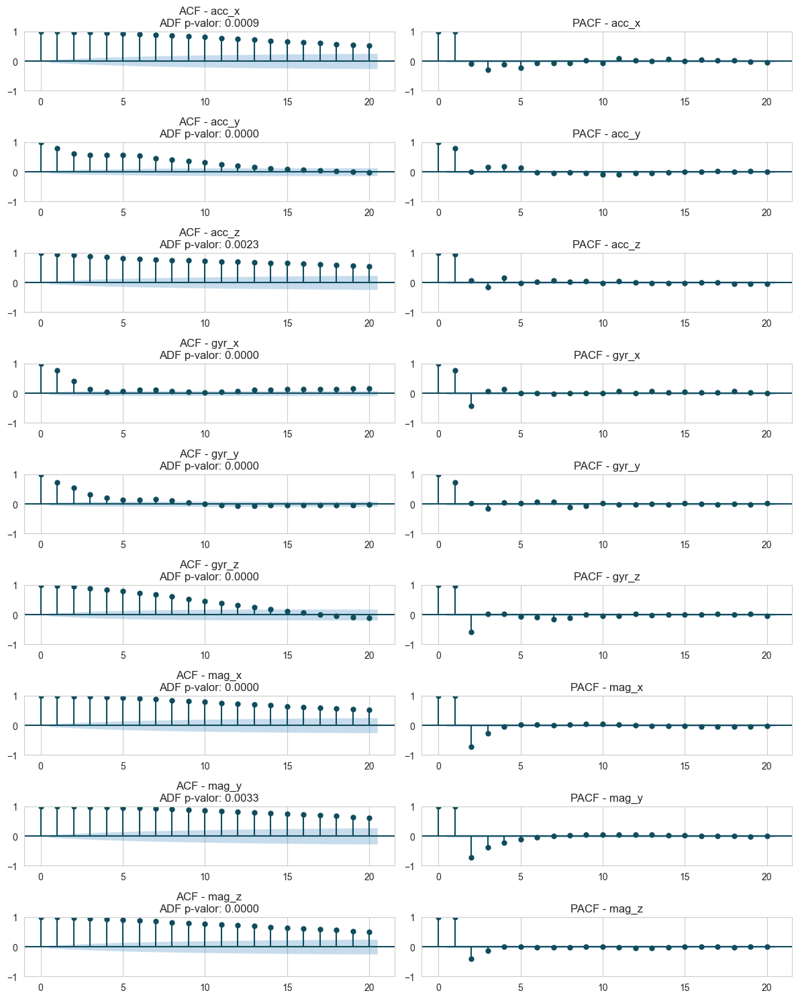

In [20]:
sns.set_style('whitegrid')
fig, axes = plt.subplots(9, 2, figsize=(12, 15))

# Para cada variable, graficamos ACF y PACF
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']

for i, var in enumerate(variables):
    result = adfuller(unidad3[var].dropna())  # Asegurarse de que no haya valores NaN
    p_value = result[1] 
    # Graficar autocorrelación (ACF)
    plot_acf(unidad3[var], lags=20, ax=axes[i, 0], color='#0F4C5C', vlines_kwargs={'color': '#0F4C5C'})
    axes[i, 0].set_title(f'ACF - {var}\nADF p-valor: {p_value:.4f}')
    
    # Graficar autocorrelación parcial (PACF)
    plot_pacf(unidad3[var], lags=20, ax=axes[i, 1], color='#0F4C5C', vlines_kwargs={'color': '#0F4C5C'})
    axes[i, 1].set_title(f'PACF - {var}')

# Ajustar el espacio entre gráficos
plt.tight_layout()
plt.show()

Con lo anterior demostramos que todas las series registradas en este sensor son estacionarias.

### ***Unidad #4***

Pasemos a analizar nuestro 4 sensor para el sujeto 3 en el ejercicio #3, ¿Las variables en este sensor seguirán la misma tendencia de las 3 anteriores que ya estudiamos?

In [21]:
unidad4.describe()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,0.079297,-1.082178,9.712155,0.007848,0.005900,0.000594,0.310713,0.303482,-0.530338
std,0.880848,0.536200,0.209483,0.075674,0.103752,0.080917,0.045954,0.030860,0.042678
min,-2.941612,-3.237855,8.812629,-0.390467,-0.794521,-0.328567,0.218105,0.242419,-0.604753
25%,-0.622443,-1.413810,9.606782,-0.020762,-0.031095,-0.037660,0.273089,0.276844,-0.566775
50%,0.111007,-1.097179,9.719803,0.008432,0.003117,-0.000566,0.309418,0.301578,-0.534492
75%,0.766085,-0.685658,9.812957,0.037465,0.039442,0.033393,0.348520,0.335533,-0.505275
max,2.421616,1.173397,11.126651,0.710628,0.685374,0.536240,0.404924,0.366891,-0.430840


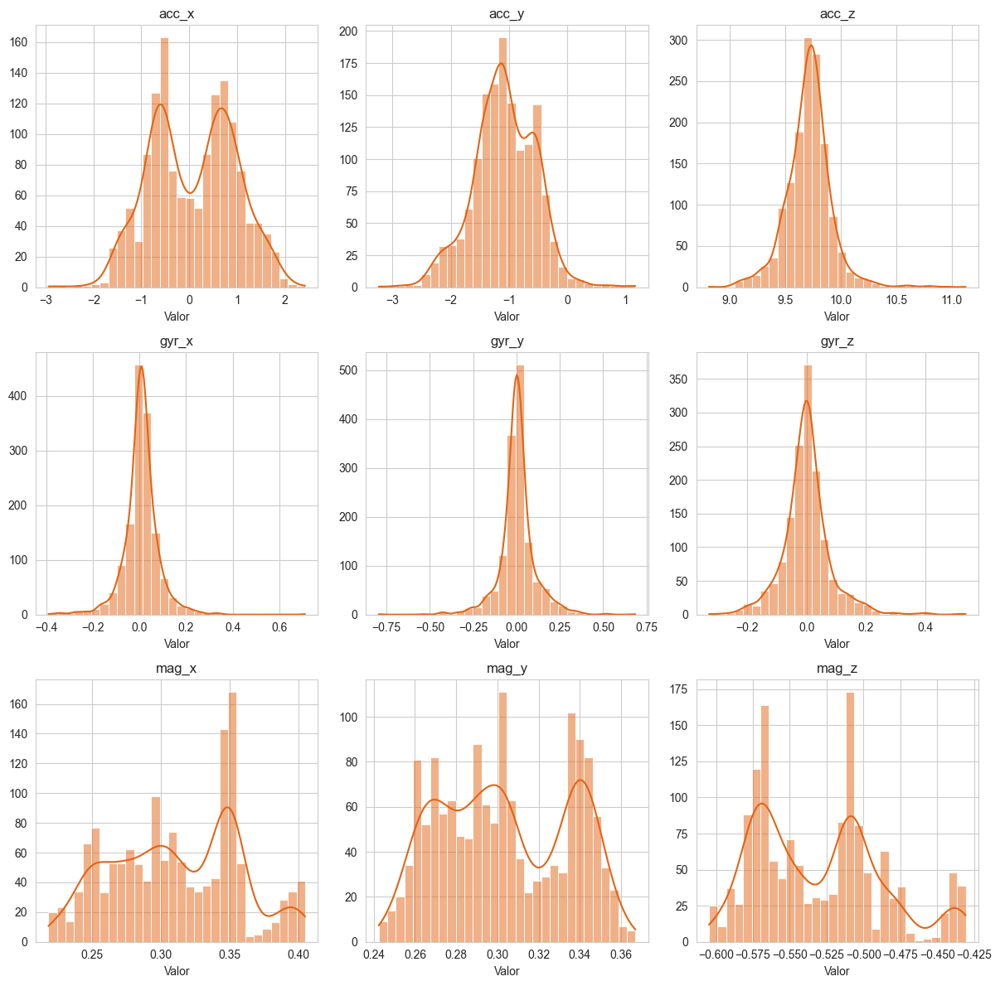

In [22]:
sns.set_style('whitegrid')
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()
for i, var in enumerate(variables):
    sns.histplot(unidad4[var], kde=True, ax=axes[i], bins=30, color='#E36414')
    axes[i].set_title(var)
    axes[i].set_xlabel('Valor')
    axes[i].set_ylabel('')
plt.tight_layout()
plt.show()

Tan solo analizando la distribución de cada una de las variables en este conjunto de datos, vemos que existe un poco mas de variabilidad en las distribuciones, vemos que muchas siguen una clara distribución normal. Veamos como se comportan estas nuevas variables.

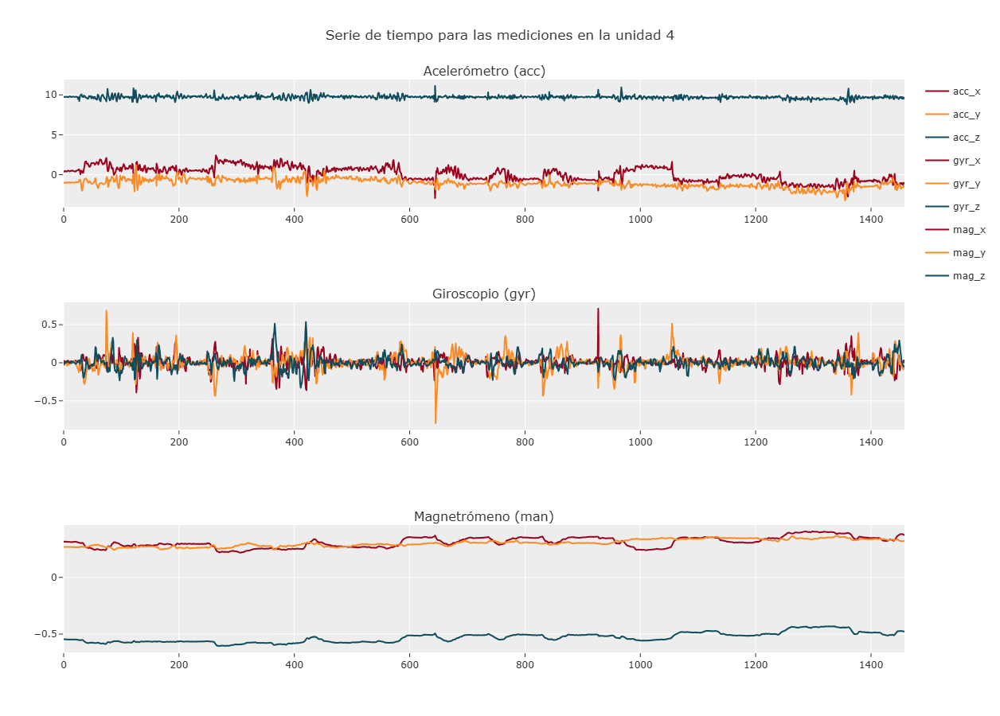

In [23]:
fig = sp.make_subplots(rows=3, cols=1, subplot_titles=['Acelerómetro (acc)', 'Giroscopio (gyr)', 'Magnetrómeno (man)'])
variables = ['acc', 'gyr', 'mag']
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
for i, var in enumerate(variables):
    fig_line = px.line(unidad4,y=[f'{var}_x', f'{var}_y', f'{var}_z'])
    for j, trace in enumerate(fig_line.data):
        trace.line.color = colores[j]
        fig.add_trace(trace, row=i + 1, col=1)

fig.update_layout(height=900, width=900, title_text="Serie de tiempo para las mediciones en la unidad 4",template='ggplot2')
fig.show()

Podemos analizar el comportamiento de estas mediciones obtenidas por la unidad 4 podemos ver claramente que estas tienen una tendencia mucho mas claras que las demas que hemos estudiado, lo que puede indicar que estas pueden ser series de tiempo no estacionarias. Como lo hemos venido haciendo, lo comprobamos con los gráficos de autocrrelación y autocorrelación parcial.

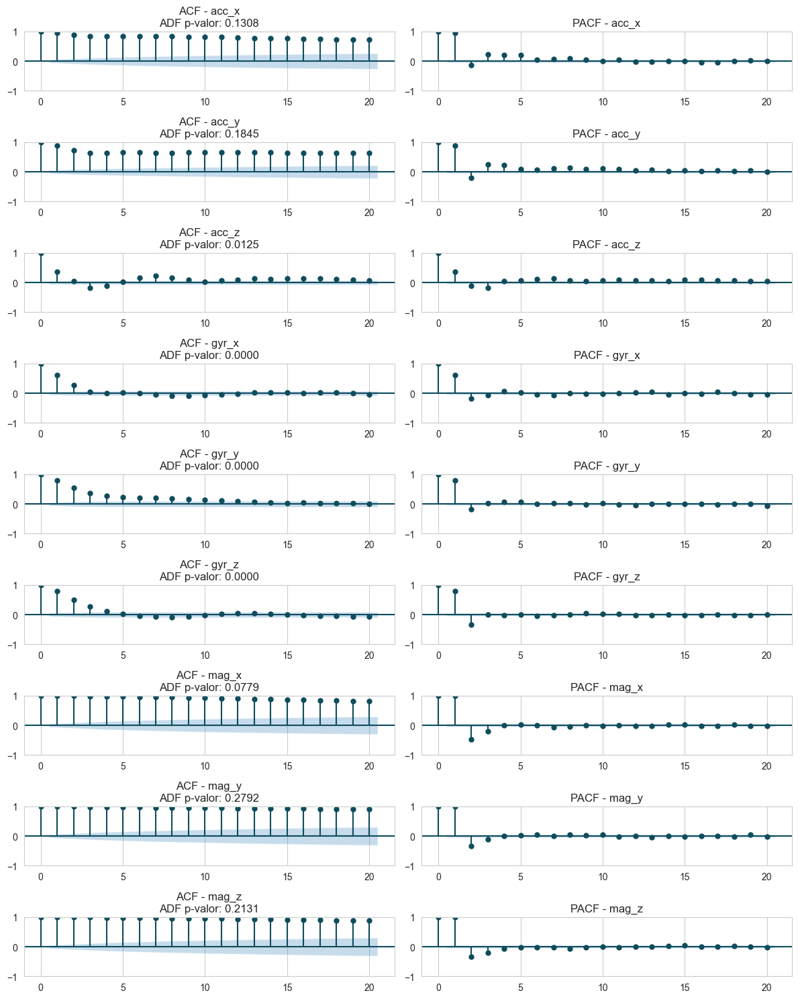

In [24]:
sns.set_style('whitegrid')
fig, axes = plt.subplots(9, 2, figsize=(12, 15))

# Para cada variable, graficamos ACF y PACF
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']

for i, var in enumerate(variables):
    result = adfuller(unidad4[var].dropna())  # Asegurarse de que no haya valores NaN
    p_value = result[1] 
    # Graficar autocorrelación (ACF)
    plot_acf(unidad4[var], lags=20, ax=axes[i, 0], color='#0F4C5C', vlines_kwargs={'color': '#0F4C5C'})
    axes[i, 0].set_title(f'ACF - {var}\nADF p-valor: {p_value:.4f}')
    
    # Graficar autocorrelación parcial (PACF)
    plot_pacf(unidad4[var], lags=20, ax=axes[i, 1], color='#0F4C5C', vlines_kwargs={'color': '#0F4C5C'})
    axes[i, 1].set_title(f'PACF - {var}')

# Ajustar el espacio entre gráficos
plt.tight_layout()
plt.show()

Si notamos, cada uno de los p-valores arrojados por la prueba analitica de duckey-fuller, podemos ver que la mayoria de la series son no estacionarias, solo las series de las variable ```acc_z```,```gyr_x```,```gyr_y``` y  ```gyr_z``` cuentan con un p-valor menor que 0.05, por tanto se rechaza la hipotesis nula y concluimos que estas 4 series son estacionarias. Veamos la descomposición de estas series estacionarias: 

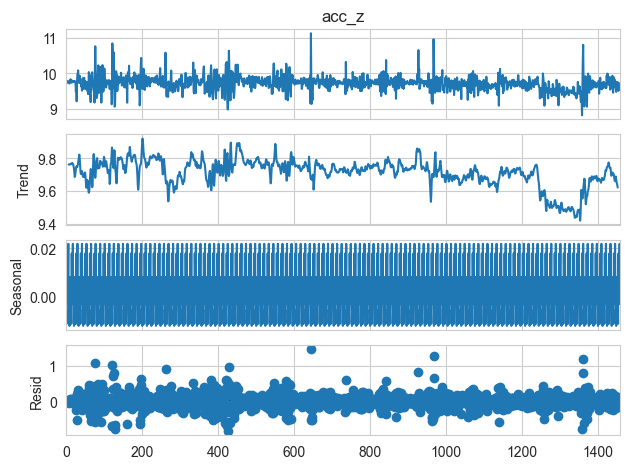

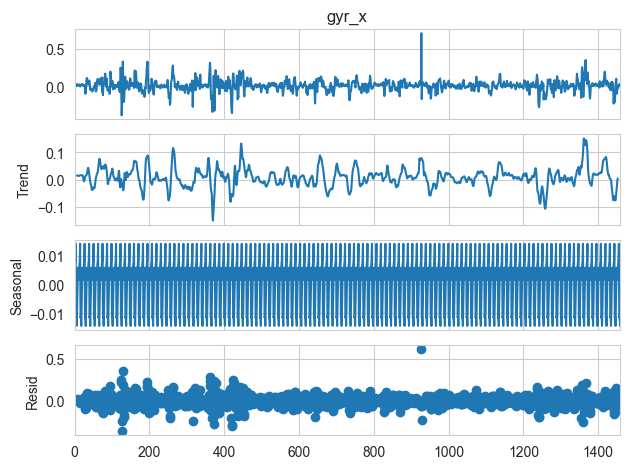

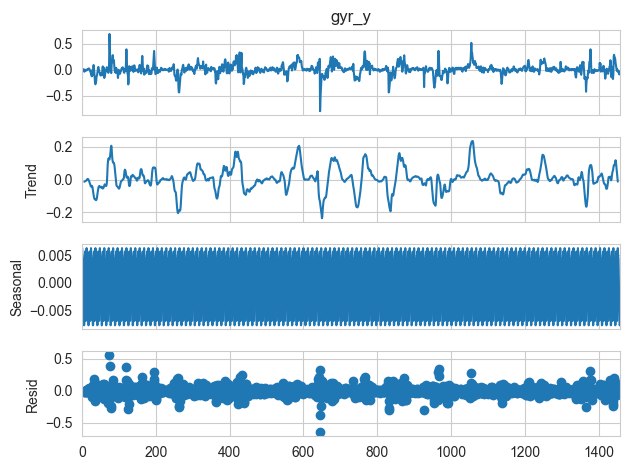

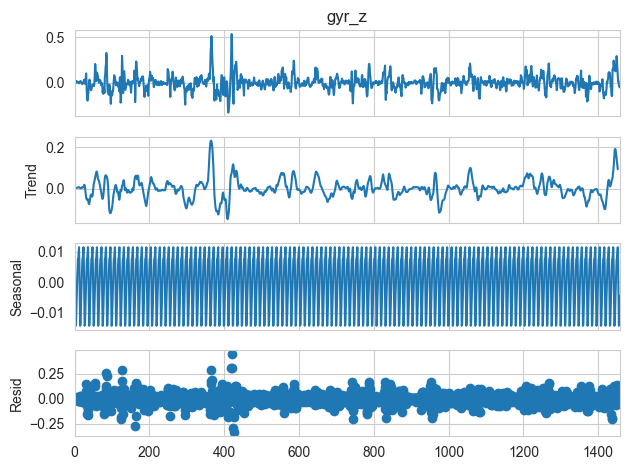

In [25]:
var= ['acc_z' , 'gyr_x' , 'gyr_y', 'gyr_z']
for var in var:
    result = seasonal_decompose(unidad4[var], model='additive', period=12)
    result.plot();

Si análisamos las 4 gráficas anteriores notamos que lo que tienen en comun es su comportamiento en su componente estacional, comprobando na vez que estas 4 variables son series estacionarias.

### ***Unidad #5***

Para finalizar con ese análisis podemos estudiar como es el comportamiento de las mediciones captadas por la unidad #5, que si recordamos es la unicada uqe se encontraba ubicada en el pecho de los participantes del estuio.

In [26]:
unidad5.describe()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,mag_x,mag_y,mag_z
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,0.592693,-9.141028,-3.417384,0.001540,-0.001723,-0.005568,-0.299329,0.710069,0.084294
std,0.202881,0.389808,0.704176,0.184271,0.045225,0.051415,0.015616,0.011160,0.047428
min,-0.016735,-11.638864,-5.773691,-0.919955,-0.319972,-0.365253,-0.341609,0.683908,-0.054663
25%,0.424592,-9.364863,-3.971793,-0.061744,-0.016538,-0.019475,-0.314682,0.701059,0.048022
50%,0.613466,-9.155687,-3.358139,-0.003100,-0.002933,-0.006248,-0.296298,0.709214,0.081414
75%,0.718222,-8.842788,-2.892912,0.059515,0.012726,0.009893,-0.286052,0.720522,0.118765
max,1.547163,-7.699570,-0.705531,1.120147,0.360519,0.292285,-0.271566,0.730635,0.193905


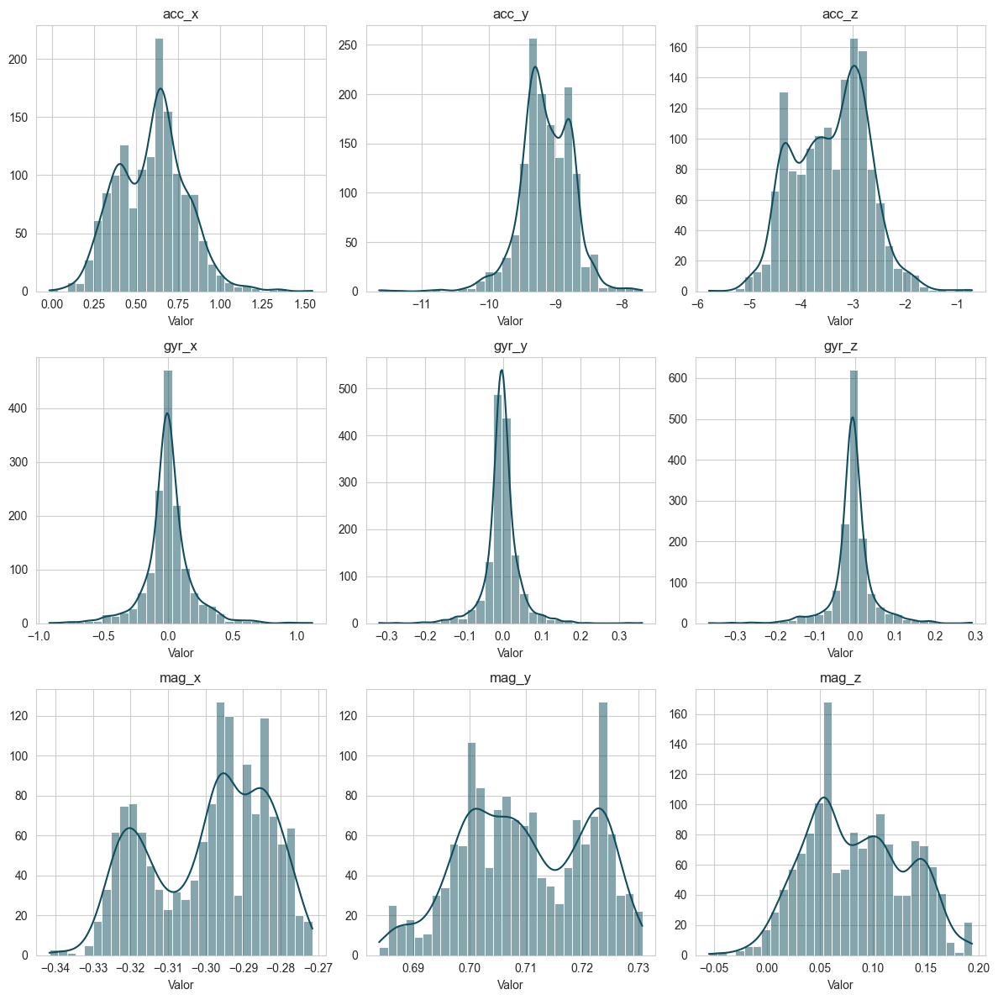

In [27]:
sns.set_style('whitegrid')
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()
for i, var in enumerate(variables):
    sns.histplot(unidad5[var], kde=True, ax=axes[i], bins=30, color='#0F4C5C')
    axes[i].set_title(var)
    axes[i].set_xlabel('Valor')
    axes[i].set_ylabel('')
plt.tight_layout()
plt.show()

Como primer análisis vemos que las distribuciones no varian mucho en las mediciones de esta unidad en comparación con las demas unidades ya analizadas, existe variabilidad en las variables de ```acc``` y ```mag```, ademas de un comportamiento de normalidad en la variable ```gyr``` veamos como se ven las gráficas de las series de tiempo.

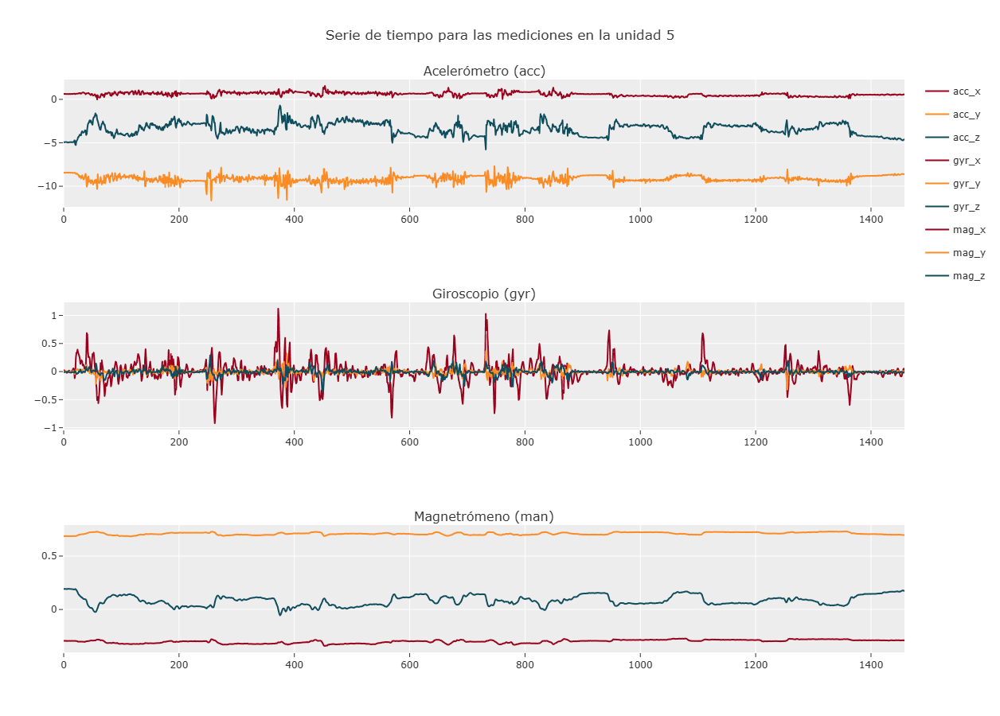

In [28]:
fig = sp.make_subplots(rows=3, cols=1, subplot_titles=['Acelerómetro (acc)', 'Giroscopio (gyr)', 'Magnetrómeno (man)'])
variables = ['acc', 'gyr', 'mag']
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
for i, var in enumerate(variables):
    fig_line = px.line(unidad5,y=[f'{var}_x', f'{var}_y', f'{var}_z'])
    for j, trace in enumerate(fig_line.data):
        trace.line.color = colores[j]
        fig.add_trace(trace, row=i + 1, col=1)

fig.update_layout(height=900, width=900, title_text="Serie de tiempo para las mediciones en la unidad 5",template='ggplot2')
fig.show()

Si revisamos estas ultimas 9 series temorales correspondientes a las de la unidad 5, podemos decir que estas parecen tener tendencias estacionarias, parecen haber ciclos con el paso del tiempo, veamos si se cumplen estas suposiiones con la ayuda de las gráficas de autocorrelación y autocorrelación parcial.

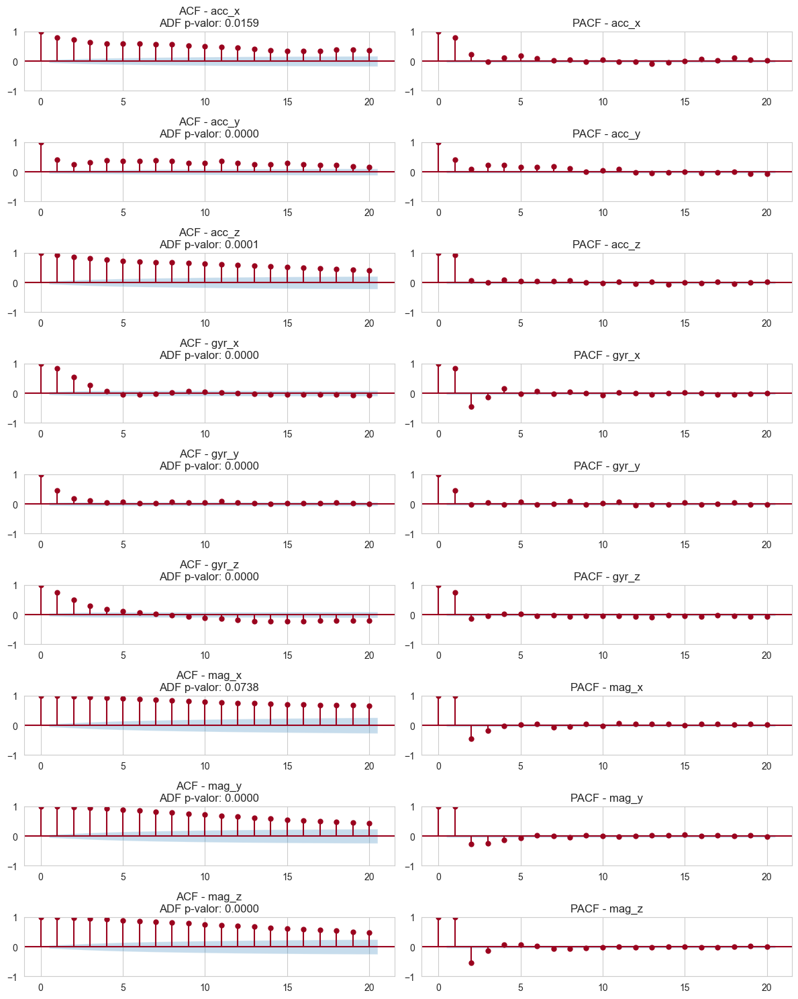

In [29]:
sns.set_style('whitegrid')
fig, axes = plt.subplots(9, 2, figsize=(12, 15))

# Para cada variable, graficamos ACF y PACF
variables = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x', 'mag_y', 'mag_z']

for i, var in enumerate(variables):
    result = adfuller(unidad5[var].dropna())  # Asegurarse de que no haya valores NaN
    p_value = result[1] 
    # Graficar autocorrelación (ACF)
    plot_acf(unidad5[var], lags=20, ax=axes[i, 0], color='#9A031E', vlines_kwargs={'color': '#9A031E'})
    axes[i, 0].set_title(f'ACF - {var}\nADF p-valor: {p_value:.4f}')
    
    # Graficar autocorrelación parcial (PACF)
    plot_pacf(unidad5[var], lags=20, ax=axes[i, 1], color='#9A031E', vlines_kwargs={'color': '#9A031E'})
    axes[i, 1].set_title(f'PACF - {var}')

# Ajustar el espacio entre gráficos
plt.tight_layout()
plt.show()

Analisando los p-valores de las pruebas realizadas en cada una de las variables de la unidad 5, podemos ver que la mayoría de las series tienen la caracteristicas de estacionarias, puesto que sus p-valores son menores que 0.05 a exepcion de una sola de las varibles que obtuvo un p-valor= 0.073, es decir que para este caso no se rechaza la hipotesis nula es decir que la serie es no estacionaria, veamos su descomposición.

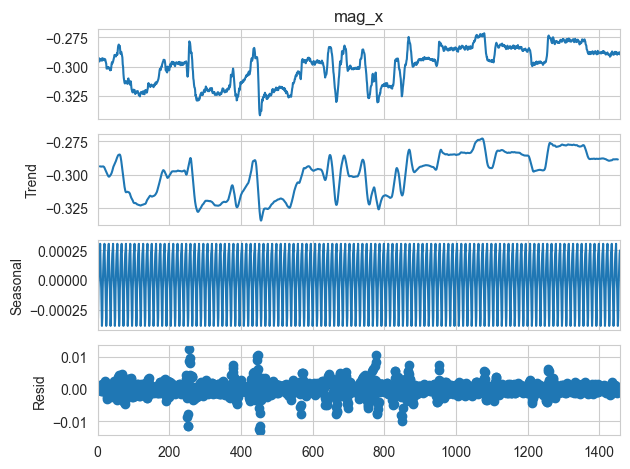

In [30]:
result = seasonal_decompose(unidad5['mag_x'], model='additive', period=12)
result.plot();

## **Modelamiento**

En esta sección se implementaran distintos modelos de regresiín con el fin de predecir cada una de las variables ```acc```, ```gyr``` y ```mag```. Los modelos a implementar serán los siguientes:

1. K-NN
2. Regresión Ridge
3. Regresión Lasso
4. Regresión lineal 
5. Random Fores Regresor
6. XGBoost Regresor 
7. SVR

```Metodología para el modelamiento:``` Para cada modelo, se elegirá una de las 9 variables disponibles en nuestros conjuntos de datos como la variable respuesta (o variable a predecir). Una vez seleccionada la variable respuesta y el modelo que se utilizará para la predicción, dicho modelo se implementará en cada uno de los conjuntos de datos correspondientes al sujeto 3. En total, se trabajará con 40 conjuntos de datos, que representan las combinaciones de las 5 unidades y los 8 ejercicios .


Por lo tanto, se implementarán 40 versiones del modelo, y se seleccionarán las 3 mejores versiones basándose en la capacidad de los modelos para captar la mayor variabilidad de los datos, medida por el coeficiente de determinación ($R^2$). Se realizará un análisis detallado de estos 3 modelos seleccionados. Para la seleccion de estos mejores modelos, se llevará a cabo un proceso de hiperparametrización empleando pliegues apropiados para datos observados en un período de tiempo, asegurando así una validación adecuada.

**Nota:** Como es presentado en la descripción del articulo de los cuales fueron obtenido los datos, se tomaron 25 observaciones por segundo, por tanto las unidades que se presenten en el análisis deben ser multiplicadas por 25, por ejemplo, si se habla de ventana de 7 días, en realidad estamos hablando de que se tomaron 7*25=175 datos.


***Funciones***

In [55]:
def resultado_df(modelo,set, parameter,y_test, predi, val, data):
    residuos = y_test - predi
    ljung_box_pvalue = acorr_ljungbox(residuos, lags=[1], return_df=True)['lb_pvalue'].iloc[0]
    jb_stat, jb_pvalue, _, _ = jarque_bera(residuos)
    tabla_knn = pd.DataFrame({
        '': [modelo],
        'Data': [set],
        'Parametro': [parameter],
        'MAPE': [mean_absolute_percentage_error(y_test, predi)],
        'MAE': [mean_absolute_error(y_test, predi)],
        'RMSE': [np.sqrt(mean_squared_error(y_test, predi))],
        'MSE': [mean_squared_error(y_test, predi)],
        'R2': [r2_score(y_test, predi)],
        'R2_val': [val],
        'LJung-Box p-value': [ljung_box_pvalue],
        'Jarque-Bera p-value': [jb_pvalue]
    })

    df = pd.concat([data, tabla_knn], ignore_index=True)
    return df


***Lectura de datos: 40 dataset para el sujeto 3***

In [56]:
data_modelos = {}

for i in range(1, 9):
    for j in range(1, 6):
        ruta = f'https://raw.githubusercontent.com/nicollF/datosss/refs/heads/main/data_modelos_fisioterapia/s3e{i}u{j}.txt'
        clave = f's3e{i}u{j}'
        df=pd.read_csv(ruta, delimiter=';')
        data_modelos[clave] = df.drop(columns='time index')



### **KNN**

Siguiendo el orden en el que se presentan las variables, escogeremos la variable respuesta en la implementación del modelo K-NN la variable `y=acc_x`, veamos como es el rendimiento de este modelo para la predicción de esta variable, ademas veremos cuales son los conjuntos de datos donde logró predecir mejor nuestra variable respuesta.

In [57]:
def funcionknn (x,y):
    r2_pro=[]

    for k in [5,10,15,20, 45]:
        for l in [14,21,28]:

            tamañotrain= l * 25
            tamañoval = 7*25
            start =0
            r2_pro=[]
            mejorscore=-np.inf

            while start <(len(x)):
                xTrain=x[start : start + tamañotrain]
                y_train=y[start : start + tamañotrain]
                
                knn=KNeighborsRegressor(n_neighbors=k)
                knn.fit(xTrain, y_train)

                for_val=start + tamañotrain + tamañoval
                if (for_val) < len(x):
                    x_val=x[ start + tamañotrain : for_val]
                    y_val=y[ start + tamañotrain : for_val]
                    y_pred=knn.predict(x_val)
                    score_r2 = r2_score(y_val, y_pred)
                    r2_pro.append(score_r2)

                start += for_val
        
                if np.mean(r2_pro)>mejorscore:
                    mejortamañotrain=l
                    mejorscore=np.mean(r2_pro)
                    mejork=k
    return(mejork,mejorscore, mejortamañotrain)
        
            

En la función anterior se hacen las respectivas particiones con el fin de ir probando el modelo y encontrando el mejor parametro $k$, que es aquel que entrega el mejor $r^2$ promedio en el conjunto de validación.

A continuacion se hace la hiperparametrización en cada uno de los dataset que previamente fueron cargados.

In [58]:
resultadoknn={}
for i in range(1,9):
    for j in range (1,6):
        datos=data_modelos[f's3e{i}u{j}']
        df=datos.copy()
        x=df.drop(columns='acc_x')
        y=df['acc_x']

        mejork, scoreval, tamaño_train= funcionknn(x, y)
        
        resultadoknn[f's3e{i}u{j}'] = {
            "mejork": mejork,
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }
        

Los resultaos del modelo fueron guardados correctamente, ahora podemos pasar a encontrar cuales fueron los 3 mejores modelos.

In [59]:
mejores_scores = sorted(resultadoknn.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain=[]

for key, values in mejores_scores:
    mejorscore = values["scoreval"]
    indicesmejorestrain.append(key)
    ventana=values['Mejor_ventana']
    parametro=values['mejork']
    print(f"Para {key}, score en la validación: {mejorscore} ventana: {ventana} K {parametro}")


Para s3e2u4, score en la validación: 0.9287519731224332 ventana: 28 K 45
Para s3e7u3, score en la validación: 0.8663134859215647 ventana: 28 K 45
Para s3e3u2, score en la validación: 0.7744462278669599 ventana: 28 K 45


Como resultado optuvimos que los mejores modelos fueron aquellos implementados en los conjuntos de datos **s3e2u4**, **s3e7u3** y **s3e3u2** con unos scores en el conjunto de validación respectivamente de 93%, 87% y 77%, ademas todos estos scores se obtuvieron en la ventana de entrenamiento de 28 observaciones y mas adelante vemos que este patrón se repetira en los otros modelos, puesto que como vimos en el EDA de este conjunto de datos, todas las variables cuentan con una varianza muy pequeña, lo que indica que en los datos anteriores a los de validación no habia mucha variabilidad y el modelo no lograba predecir bien en el conjunto de validación, por eso escoge la ventana mas grande para el tamño del conjunto de entrenamiento pues es la que logra a captar la mayor variabilidad de los datos.

Si vemos solo hemos visto como se comportan estos modelos en el conjunto de validación, veamos su comportamiento en el conjunto de test, el cual se conforma por las ultimas observaciones; veremos su rendimiento en función de las métricas y las pruebas analíticas para los residuos con el fin de comprobar los supuestos para los residuos.

In [61]:
tabla_mejores=pd.DataFrame()
graficas={}

for k in indicesmejorestrain:
    tamaño_test= resultadoknn[k]['Mejor_ventana']
    parametro=resultadoknn[k]['mejork']
    data=data_modelos[k]
    scoreval=resultadoknn[k]["scoreval"]

    x=data.drop(columns='acc_x')
    y=data['acc_x']
    xTrain=x[-35*25:-7*25]
    yTrain=y[-35*25:-7*25]
    xTest= x[-7*25:]
    obs=y[-7*25:]

    knn=KNeighborsRegressor(n_neighbors=parametro)
    knn.fit(xTrain,yTrain)
    predic=knn.predict(xTest)
    residuos= obs - predic
    scsoreTest=r2_score(obs, predic)
    
    tabla_mejores=resultado_df('K-NN',k,parametro,obs,predic,scoreval,tabla_mejores)

    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro":parametro,
        "score":scoreval,
        "residual":residuos,
        'scoreTest':scsoreTest
    }
    
tabla_mejores

,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,K-NN,s3e2u4,45,0.011010,0.099071,0.135726,0.018421,0.950471,0.928752,1.793522e-21,6.867581e-08
1,K-NN,s3e7u3,45,0.019286,0.140062,0.158227,0.025036,0.670875,0.866313,6.808886e-37,4.605388e-04
2,K-NN,s3e3u2,45,0.519855,0.504113,0.974943,0.950514,0.710648,0.774446,7.218794e-26,5.454041e-72


Analizando esta tabla que no entrega los resultados completos de estos mejores modelos knn podemos hayar diferentes conclusiones:
- El modelo que tiene los errores mas pequeños es el modelo para la data del conjunto de datos del ejercicio 2 unidad 4, por tanto es el modelo mas preciso de los 3, vemos que la diferencia de los scores del conjunto de validación y de test no son muy diferentes lo cual es lo esperado.
- Para los otros dos modelos vemos que exite un sobreajuste, es decir, el modelo aprendió mucho de los datos de entrenamiento pero no lográ predecir tan bien los datos nuevos que no ha visto.
- Ninguno de los 3 modelos cumplen con los supuestos de independendia y de normalidad, lo cual deja una duda de que es lo que pasa con el modelo que no logra captar cierta tendencia en los datos.

A continuación se presentan algunas gráficas que permiten apreciar como es el comportamiento de estos modelos.

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta acc_x**

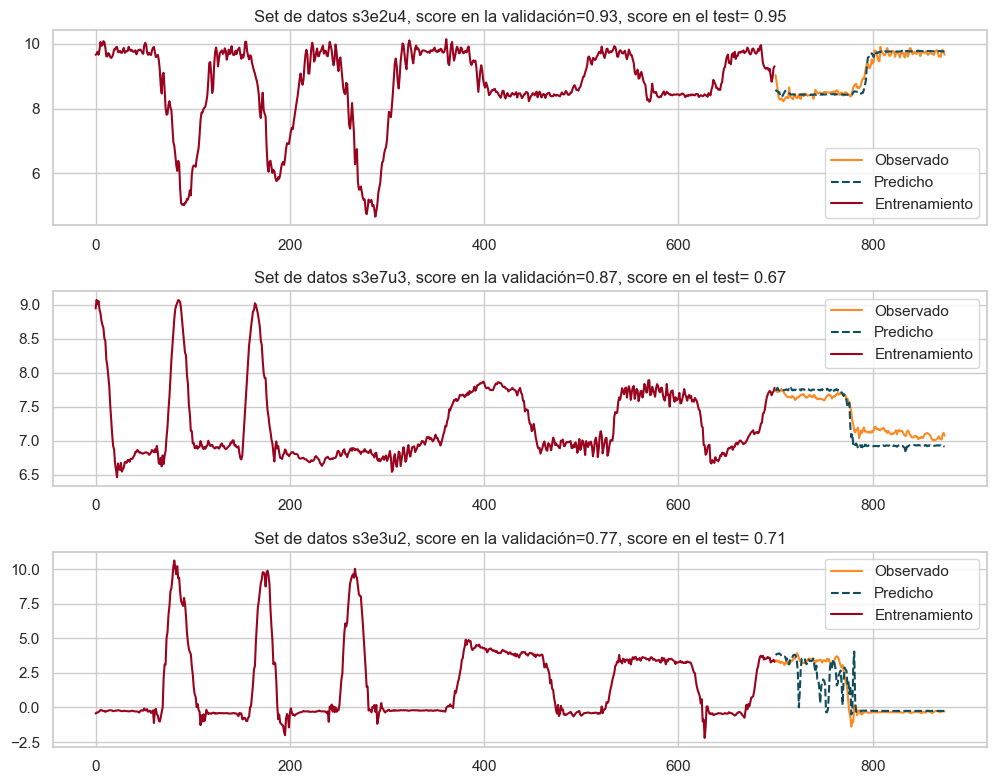

In [62]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    parametro = datos["parametro"]
    score=datos['score']
    scsoreTest=datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test= {round(scsoreTest,2)}")
    ax.legend()

plt.tight_layout()
plt.show()

Analisando la figura anterior podemos ver gráficamente lo arrojado por la tabla de resultados, es claro el buen ajuste que tiene el modelo en el conjunto del ejercicio 2 unidad 4 y tambien es notorio el sobreajuste en que se encontro en el modelo para el conjunto del ejercicio 3 unidad 2, ademas del $R^{2}$ moderado, pues la predicción no sigue de cerca los datos reales.

Veamos el comportamiento de los residuos de manera gráfica.

**Histogramas y autocorrelacion para los reiduos**

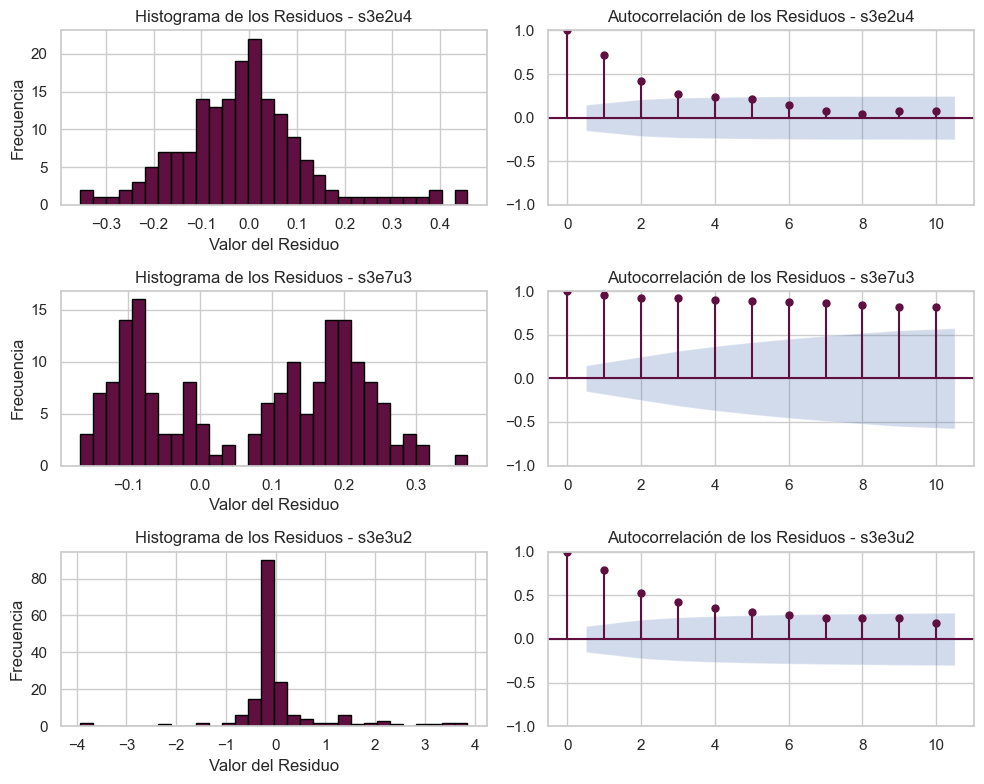

In [63]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8))  

for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0]  
    ax_acf = axes[i, 1]   

    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")

plt.tight_layout()
plt.show()

Con la gráfica anterior y si nos fijamos en los gráficos de autocorrelación, se ve claramente el patrón que no fue captado por el modelo y esta presente en los residuos, ademas por parte de los histogramas no se nota una forma de una distribución normal, podríamos pensar que los residuos en la ultima figura podrían ser normales pero con el p-valor de la prueba analítica se rechaza la hipotesis nula, por tanto los residuos no siguen una distribución normal.

### **Ridge**

Para el modelo Ridge se tomó como variaable respuesta y= acc_y, la metodología de hiperparametrización es igual a la implementada en el K-NN, veamos los resultados de este modelo para la variable respuesta en cada uno de los datasets.

In [64]:
def funcionridge(x, y):
    r2_pro = []

    for alpha in [0.001, 0.01, 0.1] :
        for l in [14, 21, 28]:  

            tamañotrain = l * 25
            tamañoval = 7 * 25
            start = 0
            r2_pro = []
            mejorscore = -np.inf

            while start < len(x):
                xTrain = x[start:start + tamañotrain]
                y_train = y[start:start + tamañotrain]
                
                ridge = Ridge(alpha=alpha)
                ridge.fit(xTrain, y_train)

                for_val = start + tamañotrain + tamañoval
                if for_val < len(x):
                    x_val = x[start + tamañotrain:for_val]
                    y_val = y[start + tamañotrain:for_val]
                    y_pred = ridge.predict(x_val)
                    score_r2 = r2_score(y_val, y_pred)
                    r2_pro.append(score_r2)

                start += for_val
            
            if np.mean(r2_pro) > mejorscore:
                mejortamañotrain = l
                mejorscore = np.mean(r2_pro)
                mejoralpha = alpha

    return mejoralpha, mejorscore, mejortamañotrain



Evaluamos cada modelo en los diferentes conjuntos de datos:

In [65]:
resultadoridge={}
for i in range(1,9):
    for j in range (1,6):
        #print(f's3e{i}u{j}')
        datos=data_modelos[f's3e{i}u{j}']
        #print(len (datos))
        df=datos.copy()
        x=df.drop(columns='acc_y')
        y=df['acc_y']

        mejoralpha, scoreval, tamaño_train= funcionridge(x, y)
        
        resultadoridge[f's3e{i}u{j}'] = {
            "mejoralpha": mejoralpha,
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }
        

Con los resultados obtenidos para le modelo Ridge en cada dataset, podemos pasar  escoger los 3 modelos que obtuvieron un buen rendimiento en el conjunto de validación.

In [66]:
mejores_scores = sorted(resultadoridge.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain_R=[]

for key, values in mejores_scores:
    mejorscore = values["scoreval"]
    ventana=values['Mejor_ventana']
    parametro=values['mejoralpha']
    indicesmejorestrain_R.append(key)
    print(f"Para {key}, score en la validación: {mejorscore} ventana: {ventana} alpha {parametro}")

Para s3e4u1, score en la validación: 0.9669865004755229 ventana: 28 alpha 0.1
Para s3e1u2, score en la validación: 0.9533387971707183 ventana: 28 alpha 0.1
Para s3e5u4, score en la validación: 0.949833375012044 ventana: 28 alpha 0.1


así segun lo anterior los mejores 3 modelos de regresión Ridge fueron aquellos entrenados con los datos de la `s3e4u1`, `s3e1u2` y `s3e5u4`, los scores obtenidos en el conjuno de validacion son bastante buenos y todos se obtuvieron en la ventana de 28, como lo dijimos antes, tiene sentido que esta sea la ventana que mejor entrena los modelos y el mejor parametro en todos es $\alpha = 0.1$.

Veamos como se comportan estos modelos en el conjunto de test, ademas de sus métricas y el análisis de sus residuos.

In [67]:
tabla_mejores_ridge=pd.DataFrame()
graficas={}

for k in indicesmejorestrain_R:
    tamaño_test= resultadoridge[k]['Mejor_ventana']
    parametro=resultadoridge[k]['mejoralpha']
    data=data_modelos[k]
    scoreval=resultadoridge[k]["scoreval"]

    x=data.drop(columns='acc_y')
    y=data['acc_y']
    xTrain=x[-35*25:-7*25]
    yTrain=y[-35*25:-7*25]
    xTest= x[-7*25:]
    obs=y[-7*25:]


    ridge = Ridge(alpha=parametro)
    ridge.fit(xTrain,yTrain)
    predic=ridge.predict(xTest)
    residuos= obs - predic

    scsoreTest=r2_score(obs, predic)
    tabla_mejores_ridge=resultado_df('Ridge',k,parametro,obs,predic,scoreval,tabla_mejores_ridge)

    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro":parametro,
        "score":scoreval,
        "residual":residuos,
        'scoreTest':scsoreTest
    }
    
tabla_mejores_ridge

,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,Ridge,s3e4u1,0.1,0.022073,0.058483,0.087331,0.007627,0.889493,0.966987,4.311415e-01,0.000000e+00
1,Ridge,s3e1u2,0.1,0.412846,0.249352,0.340889,0.116205,0.990549,0.953339,1.233064e-25,9.563087e-07
2,Ridge,s3e5u4,0.1,0.022108,0.104914,0.124025,0.015382,0.779903,0.949833,7.906826e-16,6.833638e-211


Si analizamos los resultados obtenidos por los mejores modelos en el conjunto de test, podemos notar que todos los errores en estos 3 mejores modelos son bajos, siendo los mas pequeños el modelo que tuvo los mejores r2 tanto en el test como en la validacion que es el modelo para el ejercicio 4 unidad 1, aunque este es el mejor modelo en la validación, podemos observar un sobreajuste en este modelo, a diferencia del segundo mejor modelo que es el implementado con los datos del ejercicio 1 unidad 2, donde no se encuentra un sobreajuste y aun así el modelo capta muy bien la variabilidad de los datos. Ademáss una anotación importante es que estos modelos ridge no cumplen con los supuestos de independencia y normalidad.

Veamos estas conclusiones de manera gráfiica:

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta acc_y**

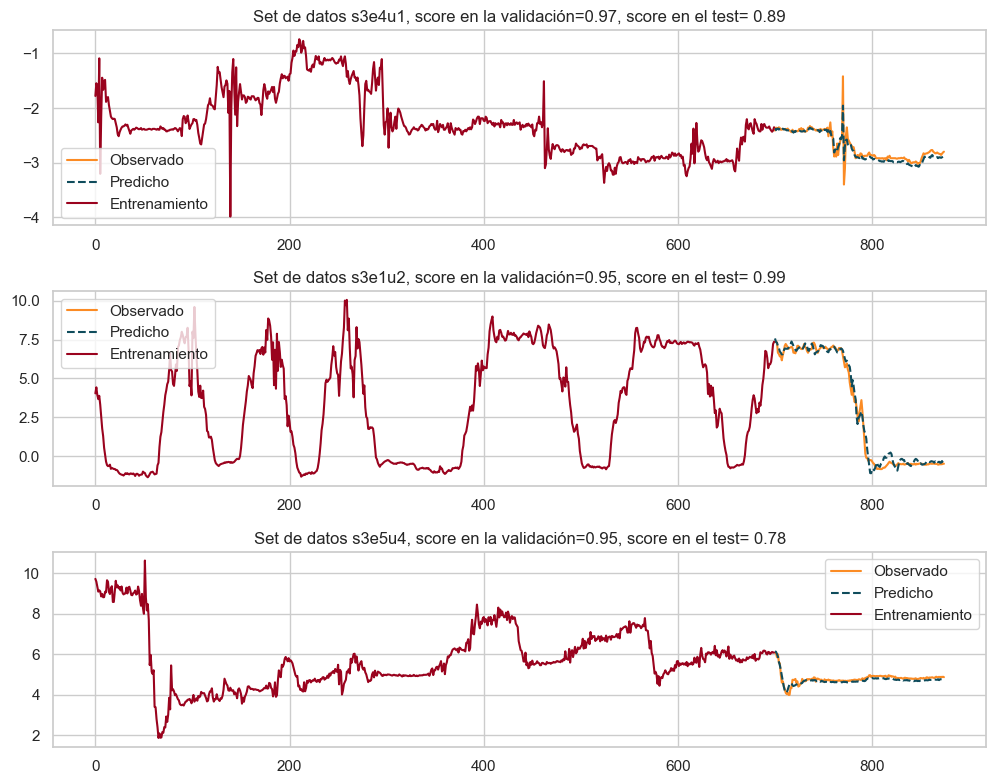

In [68]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    parametro = datos["parametro"]
    score=datos['score']
    scsoreTest=datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test= {round(scsoreTest,2)}")
    ax.legend()

plt.tight_layout()
plt.show()

Lo mas interezante al momento de analisar estas gráficas es ver se observa la afectación del sobreajusste, si recordamos anteriormente se dijo que donde no había sobreajuste era en el segundo mejor modelo y si vemos su gráfica correspondiente, en este caso es la segunda gráfica, podemos ver como las predicciones siguen muy bien a los datos reales, a diferencia de los otros dos modelos que cuentan con sobreajuste y por tanto la linea de lo predicho no es tan cercana a lo real.

Veamos ahora el comportamiendo de los residuos, que si recordamos las pruebas analíticas arrjoron que estos modelos ridge no cumplen con los supuestos de independencia y normalidad.

**Histogramas y autocorrelacion para los reiduos**

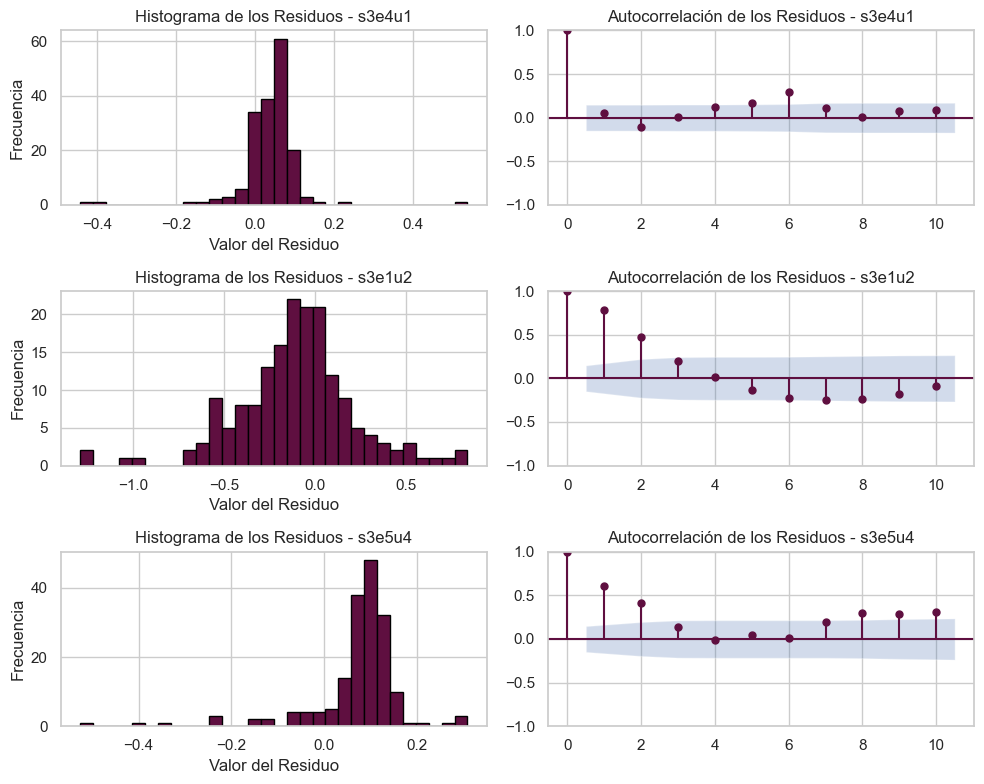

In [69]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8)) 

for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0]  
    ax_acf = axes[i, 1]  

 
    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")


plt.tight_layout()
plt.show()

Vemos claramente en la gráfica anterior la tendencia que tienen los residuos y por tanto no se cumple el supuesto de independencia y ademas vemos que las distribuciones de estos residuos parecen estar cerca de la normalidad si solo nos quedamos con el análisis gráfico pero teniendo el resultado de la prueba confirmamos que los residuos no son normales.

### **Lasso**

PAra el modelo de la regresion Lasso, se busca predecir la variable resouesta y=acc_z veamos.

In [70]:
def funcionlasso(x, y):
    r2_pro = []

    for alpha in [0.001, 0.01, 0.1] :  
        for l in [14, 21]: 

            tamañotrain = l * 25
            tamañoval = 7 * 25
            start = 0
            r2_pro = []
            mejorscore = -np.inf

            while start < len(x):
                xTrain = x[start:start + tamañotrain]
                y_train = y[start:start + tamañotrain]
               
                lasso = Lasso(alpha=alpha)
                lasso.fit(xTrain, y_train)

                for_val = start + tamañotrain + tamañoval
                if for_val < len(x):
                    x_val = x[start + tamañotrain:for_val]
                    y_val = y[start + tamañotrain:for_val]
                    y_pred = lasso.predict(x_val)
                    score_r2 = r2_score(y_val, y_pred)
                    r2_pro.append(score_r2)

                start += for_val
            
            if np.mean(r2_pro) > mejorscore:
                mejortamañotrain = l
                mejorscore = np.mean(r2_pro)
                mejoralpha = alpha

    return mejoralpha, mejorscore, mejortamañotrain


A continuación se despliega el modelo para cada conjunto de datos de sujeto 3.

In [71]:
resultadolasso={}
for i in range(1,9):
    for j in range (1,6):
        #print(f's3e{i}u{j}')
        datos=data_modelos[f's3e{i}u{j}']
        #print(len (datos))
        df=datos.copy()
        x=df.drop(columns='acc_z')
        y=df['acc_z']

        mejoralpha, scoreval, tamaño_train= funcionlasso(x, y)
        
        resultadolasso[f's3e{i}u{j}'] = {
            "mejoralpha": mejoralpha,
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }

Veamos cuales fueron esos 3 mejores modelos que obtuvieron mejor rendimiento en el conjunto de validación.

In [72]:
mejores_scores = sorted(resultadolasso.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain_L=[]

for key, values in mejores_scores:
    mejorscore = values["scoreval"]
    ventana=values['Mejor_ventana']
    parametro=values['mejoralpha']
    indicesmejorestrain_L.append(key)
    print(f"Para {key}, score en la validación: {mejorscore} ventana: {ventana} alpha {parametro}")

Para s3e2u4, score en la validación: 0.9297449510633726 ventana: 21 alpha 0.1
Para s3e1u3, score en la validación: 0.8139087452765275 ventana: 21 alpha 0.1
Para s3e6u2, score en la validación: 0.791127113488411 ventana: 21 alpha 0.1


Vemos que a diferencia de los otros dos modelos implementados, los mejores scores fueron obtenidos en la ventana de 21 días y un alpha de 0.1. 

Análicemos como se comportan estos modelos y parametros en el conjunto de test.

In [73]:
tabla_mejores_lasso=pd.DataFrame()
graficas={}

for k in indicesmejorestrain_L:
    tamaño_test= resultadolasso[k]['Mejor_ventana']
    parametro=resultadolasso[k]['mejoralpha']
    data=data_modelos[k]
    scoreval=resultadolasso[k]["scoreval"]

    x=data.drop(columns='acc_z')
    y=data['acc_z']
    xTrain=x[-35*25:-7*25]
    yTrain=y[-35*25:-7*25]
    xTest= x[-7*25:]
    obs=y[-7*25:]
    

    lasso = Lasso(alpha=parametro)
    lasso.fit(xTrain,yTrain)
    predic=lasso.predict(xTest)
    residuos= obs - predic
    scsoreTest=r2_score(obs, predic)
    tabla_mejores_lasso=resultado_df('Lasso',k,parametro,obs,predic,scoreval,tabla_mejores_lasso)

    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro":parametro,
        "score":scoreval,
        "residual":residuos,
        'scoreTest':scsoreTest
    }
    
tabla_mejores_lasso

,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,Lasso,s3e2u4,0.1,1.799939,1.178578,1.260495,1.588848,0.728357,0.929745,4.602443e-29,8.677032e-24
1,Lasso,s3e1u3,0.1,0.436914,0.164834,0.234211,0.054855,0.835554,0.813909,8.490756e-30,1.274010e-09
2,Lasso,s3e6u2,0.1,0.169921,0.501401,0.586165,0.343590,0.968287,0.791127,8.889403e-35,6.830723e-05


Nuevamente obtenemos que estos mejores modelos no cuentan con los supuestos de normalidad e independencia, aademas de esto, podemos notar que los errores cometidos en los modelos Lasso son mayores a los competidos por los otros modelos, y por ultimo pero no menos importante en la interpretación de esta tabla es que existe sobreajuste en todos estos modelos, lo cual puede indicar que Lasso no parece ser un buen modelo para predecir este tipo de datos, veamos estas conclusiones de manera gráfica.

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta acc_z**

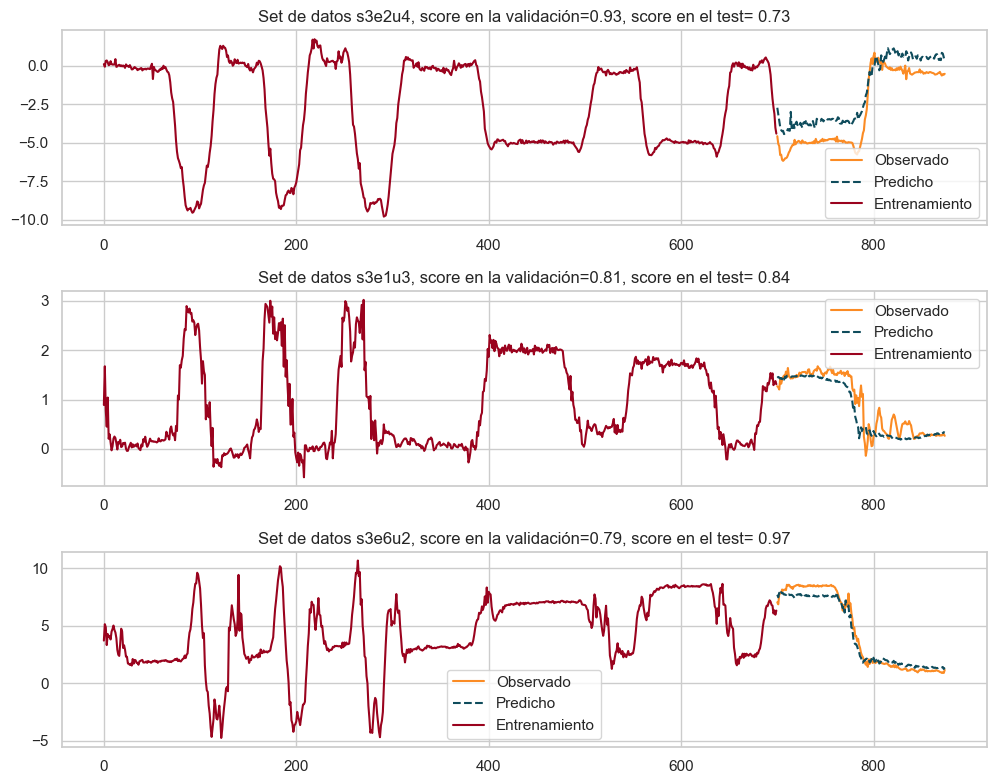

In [74]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    parametro = datos["parametro"]
    score=datos['score']
    scsoreTest=datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test= {round(scsoreTest,2)}")
    ax.legend()

plt.tight_layout()
plt.show()

Como se mencionó anteriormente el sobreajuste que esta presente en estos modelos Lasso afecta de manera directa a como se estan haciendo las predicciones en conjuntos de test que le modelo no ha visto, lo cual no es lo ideal.

Analicemos los residuos de estos modelos de manera gráfica.

**Histogramas y autocorrelacion para los reiduos**

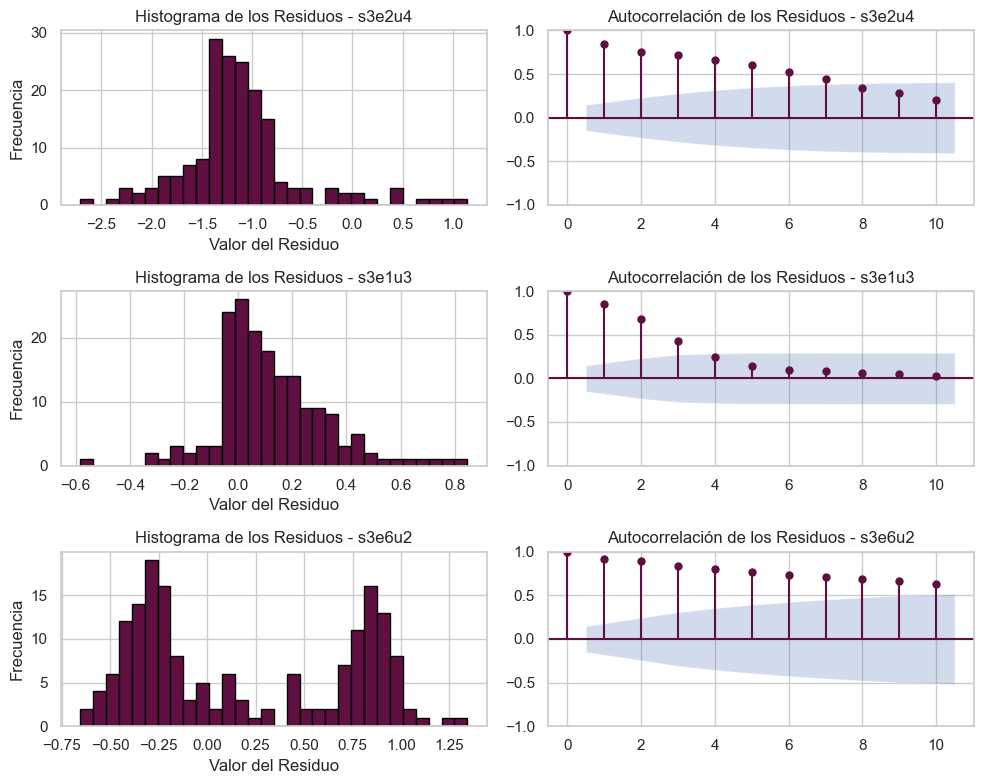

In [75]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8)) 

for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0]  
    ax_acf = axes[i, 1]   

    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")


plt.tight_layout()
plt.show()

Como conclusión podemos decir que estos modelos Lasso para la variable acc_z no son la excepción en materia de los residuos del modelo, como lo mencionamos antes, no se cumplen los supuestos de independencia y normalidad, gráficamente se respalda esta afirmación.

### **Regresion lineal**

Para la implementación del modelo de regresión lineal, siguiendo con el orden de las variables se tomó como variable respuesta y=gyr_x y tomando la misma lógica de los anteriores modelos estudiemos el rendimiento de este modelo lineal.

In [76]:
def funcion_regresion_lineal(x, y):
    r2_pro = []

    for l in [14, 21]: 
        tamañotrain = l * 25
        tamañoval = 7 * 25
        start = 0
        r2_pro = []
        mejorscore = -np.inf

        while start < len(x):
            
            xTrain = x[start:start + tamañotrain]
            y_train = y[start:start + tamañotrain]
            
           
            modelo = LinearRegression()
            modelo.fit(xTrain, y_train)

            
            for_val = start + tamañotrain + tamañoval
            if for_val < len(x):
                x_val = x[start + tamañotrain:for_val]
                y_val = y[start + tamañotrain:for_val]
                y_pred = modelo.predict(x_val)
                score_r2 = r2_score(y_val, y_pred)
                r2_pro.append(score_r2)

            start += for_val
        
        
        if np.mean(r2_pro) > mejorscore:
            mejortamañotrain = l
            mejorscore = np.mean(r2_pro)

    return mejorscore, mejortamañotrain


Aplicamos la hiperparametrización a cada uno de los conjuntos de datos.

In [77]:
resultadolineal={}
for i in range(1,9):
    for j in range (1,6):
        #print(f's3e{i}u{j}')
        datos=data_modelos[f's3e{i}u{j}']
        #print(len (datos))
        df=datos.copy()
        x=df.drop(columns='gyr_x')
        y=df['gyr_x']

        scoreval, tamaño_train= funcion_regresion_lineal(x, y)
        
        resultadolineal[f's3e{i}u{j}'] = {
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }

Veamos cuales fueron los mejores modelos para el score en el conjunto de validación.

In [78]:
mejores_scores = sorted(resultadolineal.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain_RL=[]

for key, values in mejores_scores:
    mejorscore = values["scoreval"]
    ventana=values['Mejor_ventana']
    indicesmejorestrain_RL.append(key)
    print(f"Para {key}, score en la validación: {mejorscore} ventana: {ventana}")

Para s3e1u3, score en la validación: 0.6188674328884423 ventana: 21
Para s3e2u3, score en la validación: 0.46349067193807303 ventana: 21
Para s3e1u5, score en la validación: 0.4585659240329676 ventana: 21


Los mejore modelos de la regresión lineal fueron obtenidos para la ventana de 21, vemos que estos score en el conjunto de validación no son tan altos, mas bien podrian decirse que son moderados, por lo que se espera que la variabilidad capturada por los modelos sea moderada. Veamos si se cumple esta hipotesis en el conjunto de test.

In [79]:
tabla_mejores_regresionlineal=pd.DataFrame()
graficas={}

for k in indicesmejorestrain_RL:
    tamaño_test= resultadolineal[k]['Mejor_ventana']
    data=data_modelos[k]
    scoreval=resultadolineal[k]["scoreval"]

    x=data.drop(columns='gyr_x')
    y=data['gyr_x']
    xTrain=x[-35*25:-7*25]
    yTrain=y[-35*25:-7*25]
    xTest= x[-7*25:]
    obs=y[-7*25:]
    

    Rlineal = LinearRegression()
    Rlineal.fit(xTrain,yTrain)
    predic=Rlineal.predict(xTest)
    residuos= obs - predic
    scsoreTest=r2_score(obs, predic)
    parametro=''
    tabla_mejores_regresionlineal=resultado_df('Regresión lineal',k,parametro,obs,predic,scoreval,tabla_mejores_regresionlineal)

    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro":parametro,
        "score":scoreval,
        "residual":residuos,
        'scoreTest':scsoreTest
    }
    
tabla_mejores_regresionlineal

,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,Regresión lineal,s3e1u3,,2.201483,0.050850,0.083244,0.006930,0.056884,0.618867,5.451539e-24,7.095593e-43
1,Regresión lineal,s3e2u3,,3.391452,0.019597,0.030903,0.000955,0.219807,0.463491,2.354891e-16,5.918619e-51
2,Regresión lineal,s3e1u5,,5.960952,0.022124,0.030061,0.000904,0.515532,0.458566,1.216121e-12,3.891486e-08


Lo mas importante a resaltar en los resultados del conjunto de test es que este es el mayo sobreajuste que hemos obtenido y tiene sentido puesto que sabemos por experiencia que la regresión lineal tienede a sobreajustarse, es por eso que se recomienda usar Ridge o Lasso que son variantes de la regresion lineal que agregan una penalización con el fin de evitar sobreajuste, así que era de esperarse este comportamiento de la regresión lineal, y de nuevo, estos modelos no cumplen con los supuestos para los residuos.

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta gyr_x**

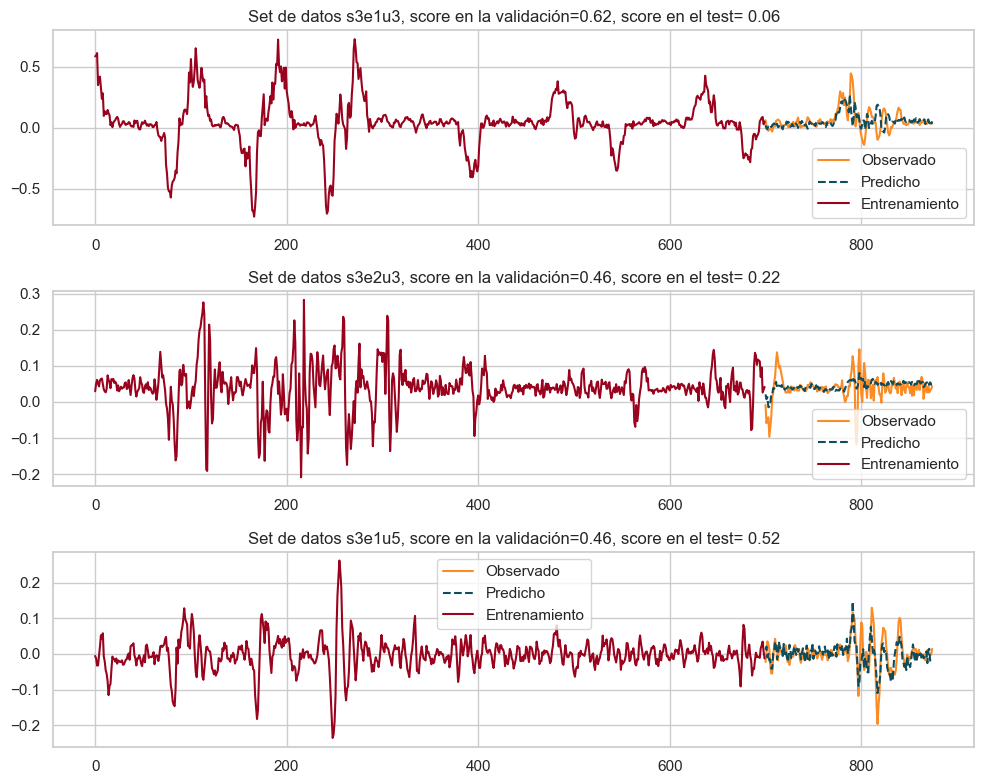

In [80]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    parametro = datos["parametro"]
    score=datos['score']
    scsoreTest=datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test= {round(scsoreTest,2)}")
    ax.legend()

plt.tight_layout()
plt.show()

Como lo mencionamos antes y al igual que lo que encontramos al analisar lasso, el sobre ajuste afecta en gran manera al momento de hacer las predicciones en el conjunto de test, sin embargo podemos analisar las predicciones hechas en al conjunto del ejercicio 1 unidad 5, pues es el unico de los 3 modelos de la regresión lineal que no tiene sobreajuste pero no cuenta con el mejor r^2, lo cual se ve reflejado en la gráfica pues la variabilidad captada por el modelo en la predicción es muy baja.

**Histogramas y autocorrelacion para los reiduos**

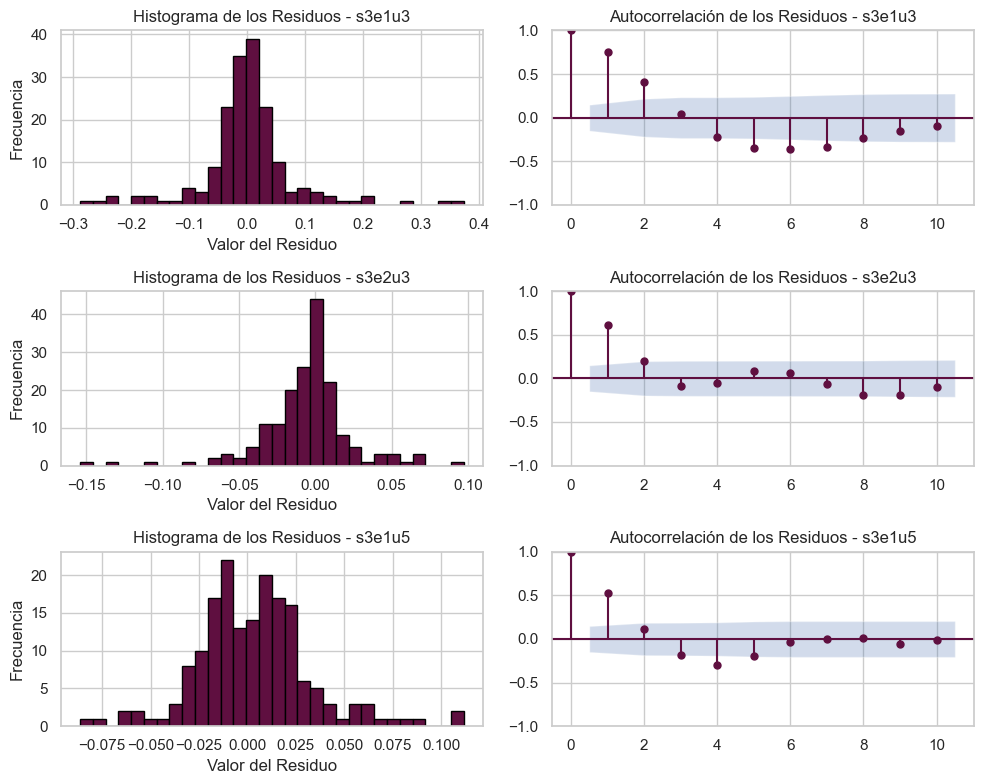

In [81]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8))


for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0]  
    ax_acf = axes[i, 1] 

    
    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    
    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")


plt.tight_layout()
plt.show()

En la gráfica anterior se ven claramente los patrones que no son captados por los modelos lineales, por los cual se confirma el hecho de que no se cumplen los supuestos para los residuos.

### **Random Forest Regresor**

Se tomará como variable respuesta la variable gry_y, la cual será predicha por la verisión de regresión de Random Forest, ¿Este modelo tendrá mejores scores? 

In [82]:
def funcion_random_forest(x, y):
    r2_pro = []

    for n_estimators in [10, 50, 100]:  
        for l in [14, 21]:  

            tamañotrain = l * 25
            tamañoval = 7 * 25
            start = 0
            r2_pro = []
            mejorscore = -np.inf

            while start < len(x):
                xTrain = x[start:start + tamañotrain]
                y_train = y[start:start + tamañotrain]
                
                
                rf = RandomForestRegressor(n_estimators=n_estimators)
                rf.fit(xTrain, y_train)

                
                for_val = start + tamañotrain + tamañoval
                if for_val < len(x):
                    x_val = x[start + tamañotrain:for_val]
                    y_val = y[start + tamañotrain:for_val]
                    y_pred = rf.predict(x_val)
                    score_r2 = r2_score(y_val, y_pred)
                    r2_pro.append(score_r2)

                start += for_val

                if np.mean(r2_pro) > mejorscore:
                    mejortamañotrain = l
                    mejorscore = np.mean(r2_pro)
                    mejorestimators = n_estimators

    return mejorestimators, mejorscore, mejortamañotrain


Luego se pasa a dsplegar un modelo de Random Forest en cada uno de los 40 dataset del sujeto 3.

In [83]:
resultado_rf = {}
for i in range(1, 9):
    for j in range(1, 6):
        datos = data_modelos[f's3e{i}u{j}']
        df = datos.copy()
        x = df.drop(columns='gyr_y')
        y = df['gyr_y']

        mejorestimators, scoreval, tamaño_train = funcion_random_forest(x, y)
        
        resultado_rf[f's3e{i}u{j}'] = {
            "mejorestimators": mejorestimators,
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }

Con los resultados guardados en el diccionario de resultados, veamos cuales fueron los mejores modelos.

In [84]:
mejores_scores = sorted(resultado_rf.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain_RF=[]

for key, values in mejores_scores:
    mejorscore = values["scoreval"]
    indicesmejorestrain_RF.append(key)
    ventana=values['Mejor_ventana']
    parametro=values['mejorestimators']
    print(f"Para {key}, score en la validación: {mejorscore} ventana: {ventana} mejor estimador {parametro}")

Para s3e6u2, score en la validación: 0.9617848864783376 ventana: 21 mejor estimador 100
Para s3e1u2, score en la validación: 0.935386325985957 ventana: 21 mejor estimador 100
Para s3e8u3, score en la validación: 0.9081863471090009 ventana: 21 mejor estimador 100


Analizando estos 3 mejores modelos, se tiene que el mejor estimador fue generar 10 arbloes y todos en la ventana de 21 días entregando así unos muy buenos score en el conjunto de validación, veamos que ocurre con estos modelos en el conjunto de test.

In [85]:
tabla_mejores_rf = pd.DataFrame() 
graficas = {}

for k in indicesmejorestrain_RF:  # Asegúrate de usar la lista de índices correcta
    tamaño_test = resultado_rf[k]['Mejor_ventana']
    parametro = resultado_rf[k]['mejorestimators']
    data = data_modelos[k]
    scoreval = resultado_rf[k]["scoreval"]

    x = data.drop(columns='gyr_y')
    y = data['gyr_y']

    # Dividir los datos en entrenamiento y prueba
    xTrain = x[-35 * 25:-7 * 25]
    yTrain = y[-35 * 25:-7 * 25]
    xTest = x[-7 * 25:]
    obs = y[-7 * 25:]

    # Ajuste y predicción con Random Forest
    rf = RandomForestRegressor(n_estimators=50)
    rf.fit(xTrain, yTrain)
    predic = rf.predict(xTest)

    # Cálculo de residuos y R² en el conjunto de prueba
    residuos = obs - predic
    scsoreTest = r2_score(obs, predic)

    # Llamada a la función `resultado_df` (debe estar definida en tu entorno)
    tabla_mejores_rf = resultado_df('Random Forest', k, parametro, obs, predic, scoreval, tabla_mejores_rf)

    # Almacenar los datos para las gráficas
    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro": parametro,
        "score": scoreval,
        "residual": residuos,
        'scoreTest': scsoreTest
    }

tabla_mejores_rf


,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,Random Forest,s3e6u2,100,8.701748,0.088692,0.149515,0.022355,0.927680,0.961785,1.591554e-19,0.000000e+00
1,Random Forest,s3e1u2,100,1.970530,0.032291,0.045637,0.002083,0.845179,0.935386,2.930913e-27,1.394469e-18
2,Random Forest,s3e8u3,100,3.690669,0.022167,0.039925,0.001594,0.606972,0.908186,3.057683e-19,0.000000e+00


En los mejores modelos de Randon Forest se pueden observar que no exites un sobreajuste como lo estaban presentando los modelos anteriores,vemos que los errores no son grandes, si estudiamos a profundidad el mejor modelo que fue el desplegado para los datos del ejercicio seis unidad 2, el MAPE es de un 11%. En general los scores entre validación y test son bastante buenos, pero tenemos la presencia de un subajuste en el tercer mejor modelo con un score de 91% en el conjunto de validación y 64% en el de test, lo que marca un subajuste claro. Nuevamente estos modelos no cumplen con los supuestos para los residuos.

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta gyr_y**

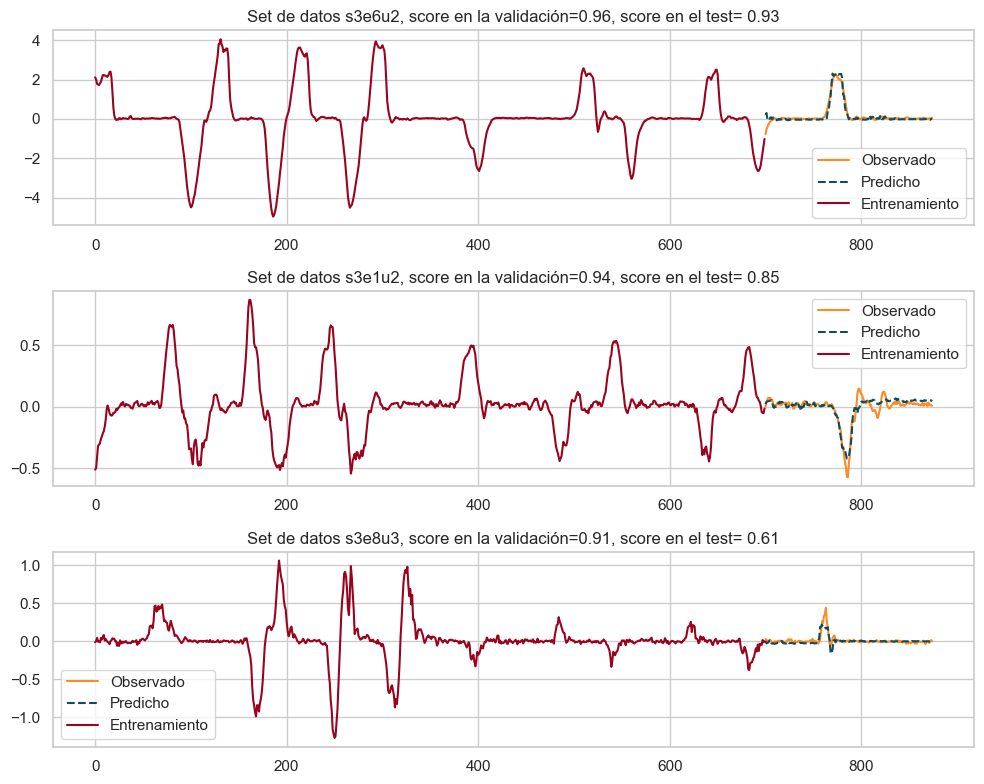

In [86]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    parametro = datos["parametro"]
    score=datos['score']
    scsoreTest=datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test= {round(scsoreTest,2)}")
    ax.legend()

plt.tight_layout()
plt.show()

Como lo dijimos anteriormente estos modelo de Random Forest tienen un buen ajuste, lo que se ve reflejado en la buena prediccioón que estan haciendo en el conjunto de test.

Veamos como se ven los residuos los cuales las pruebas analíticas arrojaron que no seguian una distribución normal y que existía una correlación entre ellos.

**Histograma y autocorrelación para los residuos.**

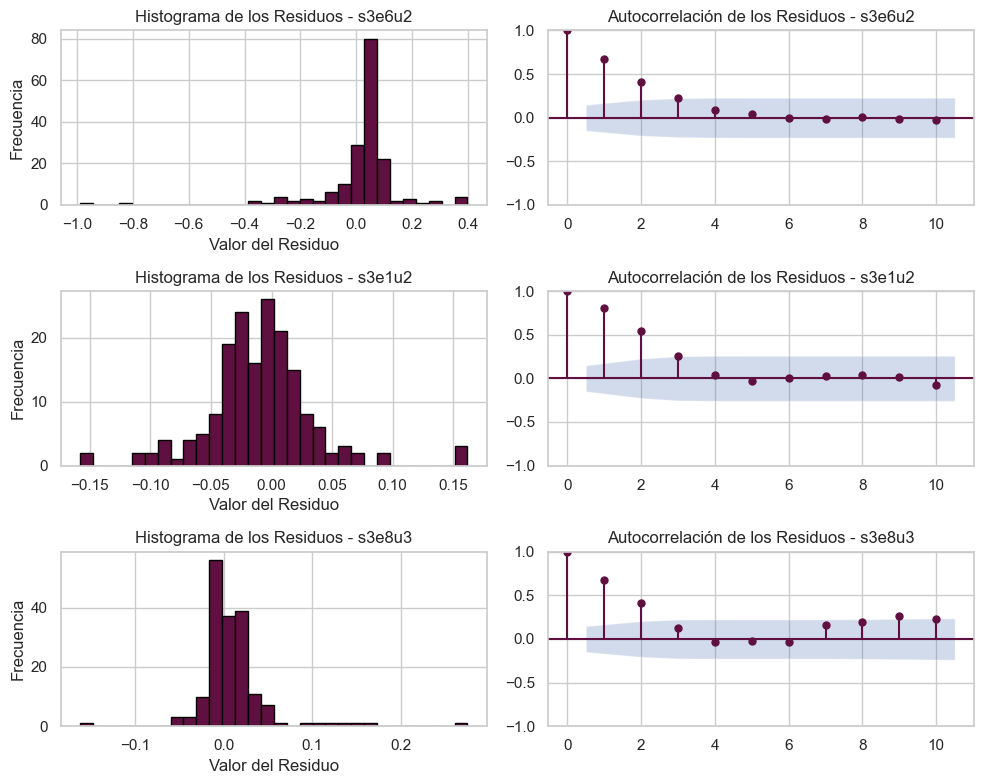

In [87]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8)) 

for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0]  
    ax_acf = axes[i, 1]   

    
    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    
    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")


plt.tight_layout()
plt.show()

Gráficamente se confirma la no normalidad y la correlación presente entre los residuos de los modelos de Randon Forest Regresor.

### **XGBoost**

Para la implementación del modelo XGBoost la variable respueta será la variable gyr_z.

In [88]:
def funcion_xgboost_gpu(x, y):
    r2_pro = []
    for n_estimators in [10, 50, 100]:  
        for max_depth in [3, 5, 7]: 
            for l in [14, 21]:  

                tamañotrain = l * 25
                tamañoval = 7 * 25
                start = 0
                r2_pro = []
                mejorscore = -np.inf

                while start < len(x):
                    xTrain = x[start:start + tamañotrain]
                    y_train = y[start:start + tamañotrain]
                    
                    xgb = XGBRegressor(
                        n_estimators=n_estimators, 
                        max_depth=max_depth, 
                        tree_method='gpu_hist'  
                    )
                    xgb.fit(xTrain, y_train)

                    for_val = start + tamañotrain + tamañoval
                    if for_val < len(x):
                        x_val = x[start + tamañotrain:for_val]
                        y_val = y[start + tamañotrain:for_val]
                        y_pred = xgb.predict(x_val)
                        score_r2 = r2_score(y_val, y_pred)
                        r2_pro.append(score_r2)

                    start += for_val

                    if np.mean(r2_pro) > mejorscore:
                        mejortamañotrain = l
                        mejorscore = np.mean(r2_pro)
                        mejor_n_estimators = n_estimators
                        mejor_max_depth = max_depth

    return mejor_n_estimators, mejor_max_depth, mejorscore, mejortamañotrain


Entremos un modelo para cada uno de los datos del sujeto 3 y veamos mas adelante cuales son los mejores scores en el conjunto de validación.

In [89]:
resultado_xgb = {}
for i in range(1, 9):
    for j in range(1, 6):
        datos = data_modelos[f's3e{i}u{j}']
        df = datos.copy()
        x = df.drop(columns='gyr_z')
        y = df['gyr_z']

        mejor_n_estimators, mejor_max_depth, scoreval, tamaño_train = funcion_xgboost_gpu(x, y)
        
        resultado_xgb[f's3e{i}u{j}'] = {
            "mejor_n_estimators": mejor_n_estimators,
            "mejor_max_depth": mejor_max_depth,
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }


In [90]:
mejores_scores_xgb = sorted(resultado_xgb.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain_XGB = []

for key, values in mejores_scores_xgb:
    mejorscore = values["scoreval"]
    indicesmejorestrain_XGB.append(key)
    ventana = values['Mejor_ventana']
    n_estimators = values['mejor_n_estimators']
    max_depth = values['mejor_max_depth']
    
    print(f"Para {key}, score en la validación: {mejorscore}, ventana: {ventana}, número de estimadores: {n_estimators}, profundidad máxima: {max_depth}")


Para s3e1u2, score en la validación: 0.9693313074330696, ventana: 21, número de estimadores: 100, profundidad máxima: 7
Para s3e6u2, score en la validación: 0.919105299794208, ventana: 21, número de estimadores: 100, profundidad máxima: 7
Para s3e4u3, score en la validación: 0.8950722640079114, ventana: 21, número de estimadores: 100, profundidad máxima: 7


Los 3 modelos anteriores fueron aquellos que obtuvieron los mejores scores en el conjunto de validación, al igual que en el modelos de random forest con un número de estimadores de 100 arboles y ademas el parametro adicional de estos modelos xgboost que es la profundidad maxima fue escogída una profundidad de 7 y todos en la ventana de 21 días, los scores son muy buenos, veamos si siguen así de bien los scores en el conjunto de test.

In [91]:
tabla_mejores_xgb = pd.DataFrame() 
graficas={}

for k in indicesmejorestrain_XGB:  
    tamaño_test = resultado_xgb[k]['Mejor_ventana']
    n_estimators = resultado_xgb[k]['mejor_n_estimators']
    max_depth = resultado_xgb[k]['mejor_max_depth']
    data = data_modelos[k]
    scoreval = resultado_xgb[k]["scoreval"]

    x = data.drop(columns='gyr_z')
    y = data['gyr_z']

    xTrain = x[-28 * 25:-7 * 25]
    yTrain = y[-28 * 25:-7 * 25]
    xTest = x[-7 * 25:]
    obs = y[-7 * 25:]

    xgb_model = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, tree_method='gpu_hist')  # Usando GPU
    xgb_model.fit(xTrain, yTrain)
    predic = xgb_model.predict(xTest)

    residuos = obs - predic
    scoreTest = r2_score(obs, predic)

    tabla_mejores_xgb = resultado_df('XGBoost', k, n_estimators, obs, predic, scoreval, tabla_mejores_xgb)
    print(k)

    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro_n_estimators": n_estimators,
        "parametro_max_depth": max_depth,
        "score": scoreval,
        "residual": residuos,
        'scoreTest': scoreTest
    }

tabla_mejores_xgb


s3e1u2
s3e6u2
s3e4u3


,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,XGBoost,s3e1u2,100,18.871422,0.072236,0.143361,0.020552,0.846854,0.969331,1.014971e-24,0.000000e+00
1,XGBoost,s3e6u2,100,3.608862,0.043570,0.081595,0.006658,0.846506,0.919105,1.692286e-23,0.000000e+00
2,XGBoost,s3e4u3,100,0.876159,0.038988,0.062588,0.003917,0.190170,0.895072,6.336416e-18,1.601044e-122


En los resultados obtenidos para los modelos de XGBoost en el conjunto de test observamos unos errores muy parecidos a los de los otros modelos, unos buenos scores en el conjunto de test sin generar sobreajuste y nuevamente encontramos que los residuos no cumplen con los supuestos de los residuos, veamos estos resultados de manera gráfica.

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta gyr_z**

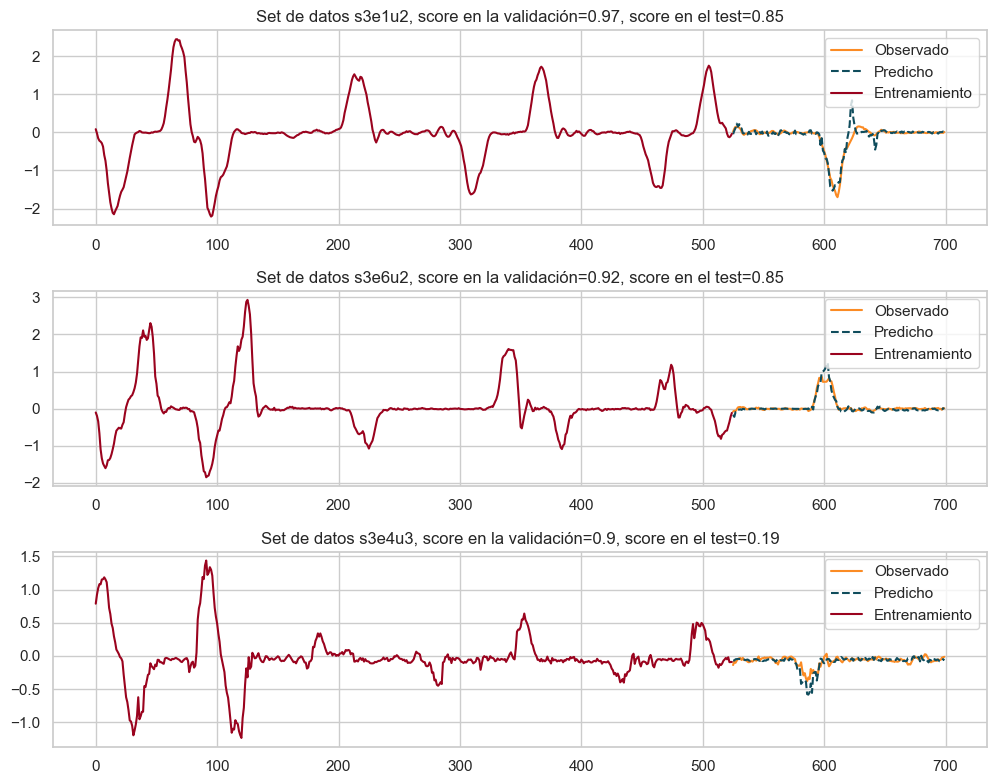

In [92]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    '''n_estimators = datos["parametro_n_estimators"]
    max_depth = datos["parametro_max_depth"]'''
    score = datos['score']
    scoreTest = datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test={round(scoreTest, 2)}")
    ax.legend()

plt.tight_layout()
plt.show()


En la figura anterior podemos observar el conjunto de entrenamiento, los valores reales y lo predicciones en el conjunto de test, vemos que las mejores predecciones estan en los modelos 1 y 2, siendo la prediccion del modelo 3 la que obtuvo el rendimiento mas moderado.

**Histogramas y autocorrelación para los residuos**

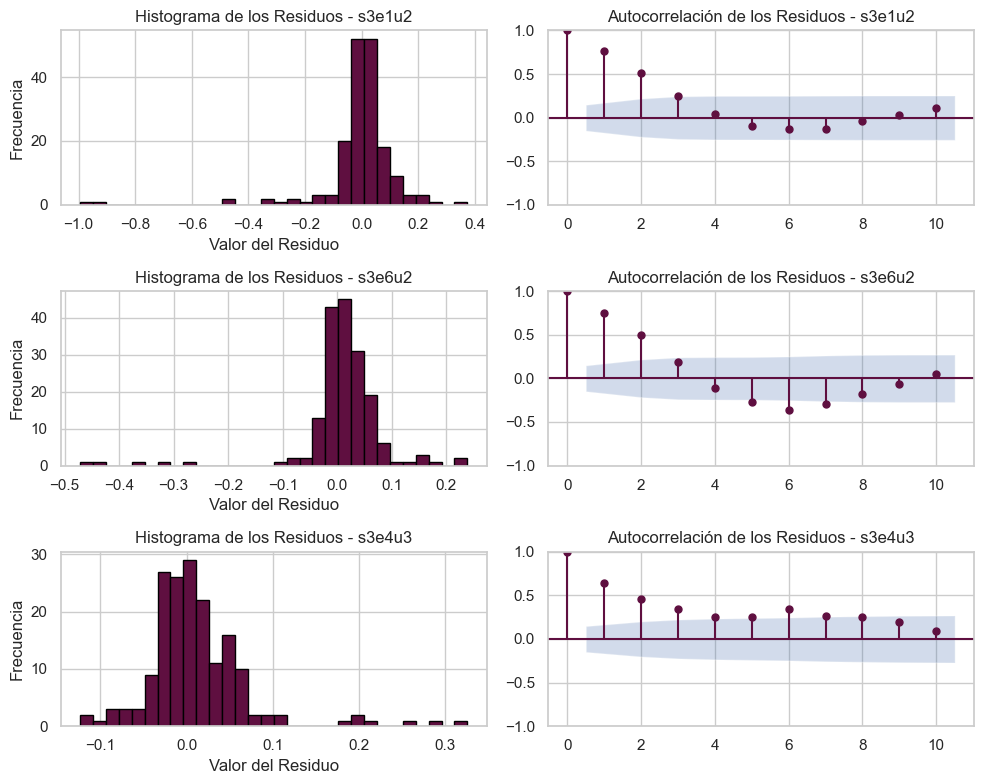

In [93]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8))  

for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0] 
    ax_acf = axes[i, 1]   

    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")


plt.tight_layout()
plt.show()

### **SVR**

Para la implementacion de este ultimo modelo de regresión se temara como variable respuesta la variable mag_x.

In [94]:

def funcion_svr(x, y):
    r2_pro = []
    for C in [0.1, 1, 10]: 
        for kernel in ['linear', 'rbf']: 
            for l in [14, 21]: 

                tamañotrain = l * 25
                tamañoval = 7 * 25
                start = 0
                r2_pro = []
                mejorscore = -np.inf

                while start < len(x):

                    xTrain = x[start:start + tamañotrain]
                    y_train = y[start:start + tamañotrain]

                    svr = SVR(C=C, kernel=kernel)
                    svr.fit(xTrain, y_train)

                    for_val = start + tamañotrain + tamañoval
                    if for_val < len(x):
                        x_val = x[start + tamañotrain:for_val]
                        y_val = y[start + tamañotrain:for_val]
                        y_pred = svr.predict(x_val)
                        score_r2 = r2_score(y_val, y_pred)
                        r2_pro.append(score_r2)

                    start += for_val

                    if np.mean(r2_pro) > mejorscore:
                        mejortamañotrain = l
                        mejorscore = np.mean(r2_pro)
                        mejor_C = C
                        mejor_kernel = kernel

    return mejor_C, mejor_kernel, mejorscore, mejortamañotrain


Veamos las implementaciones de los modelos SVR para cada conjunto de datos.

In [95]:
resultado_svr = {}
for i in range(1, 9):
    for j in range(1, 6):
        datos = data_modelos[f's3e{i}u{j}']
        df = datos.copy()
        x = df.drop(columns='mag_x')
        y = df['mag_x']

        mejor_C, mejor_kernel, scoreval, tamaño_train = funcion_svr(x, y)
        
        resultado_svr[f's3e{i}u{j}'] = {
            "mejor_C": mejor_C,
            "mejor_kernel": mejor_kernel,
            "Mejor_ventana": tamaño_train,
            "scoreval": scoreval
        }



Veamos cuales fueron los mejores modelos de los implementados en SVR.

In [96]:
mejores_scores_svr = sorted(resultado_svr.items(), key=lambda item: item[1]["scoreval"], reverse=True)[:3]
indicesmejorestrain_SVR = []

for key, values in mejores_scores_svr:
    mejorscore = values["scoreval"]
    indicesmejorestrain_SVR.append(key)
    ventana = values['Mejor_ventana']
    C = values['mejor_C']
    kernel = values['mejor_kernel']
    
    print(f"Para {key}, score en la validación: {mejorscore}, ventana: {ventana}, C: {C}, kernel: {kernel}")


Para s3e1u2, score en la validación: 0.9886474212367984, ventana: 21, C: 10, kernel: rbf
Para s3e6u2, score en la validación: 0.9776234437179582, ventana: 21, C: 10, kernel: rbf
Para s3e7u3, score en la validación: 0.9741794928209462, ventana: 21, C: 10, kernel: rbf


Mas adelante llegaremos a la conclusión de que los resultados del modelo SVR  serán los mejores, y ya vemos que estos son los mejores scores que hemos obtenido en los conjuntos de validación, estos fueron obtenidos en la ventana 21, con un paremetro de relajación de 10 y un kernel lineal.

Veamos el comportamiento en el test.

In [97]:
tabla_mejores_svr = pd.DataFrame() 
graficas = {}

for k in indicesmejorestrain_SVR: 
    tamaño_test = resultado_svr[k]['Mejor_ventana']
    C = resultado_svr[k]['mejor_C']
    kernel = resultado_svr[k]['mejor_kernel']
    data = data_modelos[k]
    scoreval = resultado_svr[k]["scoreval"]

    x = data.drop(columns='mag_x')
    y = data['mag_x']

    xTrain = x[-28 * 25:-7 * 25]
    yTrain = y[-28 * 25:-7 * 25]
    xTest = x[-7 * 25:]
    obs = y[-7 * 25:]

    svr_model = SVR(C=C, kernel=kernel)
    svr_model.fit(xTrain, yTrain)
    predic = svr_model.predict(xTest)

    residuos = obs - predic
    scoreTest = r2_score(obs, predic)

    tabla_mejores_svr = resultado_df('SVR', k, C, obs, predic, scoreval, tabla_mejores_svr)
    
    graficas[k] = {
        "obs": obs,
        "predic": predic,
        "train": yTrain,
        "parametro_C": C,
        "parametro_kernel": kernel,
        "score": scoreval,
        "residual": residuos,
        'scoreTest': scoreTest
    }

tabla_mejores_svr


,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value
0,SVR,s3e1u2,10,0.233476,0.046841,0.060253,0.003630,0.942769,0.988647,5.912890e-35,5.307408e-08
1,SVR,s3e6u2,10,0.209196,0.089256,0.093372,0.008718,0.957203,0.977623,2.400609e-35,3.001236e-29
2,SVR,s3e7u3,10,0.058138,0.039802,0.049633,0.002463,0.232373,0.974179,1.255353e-39,3.730333e-06


Revisando los resultados de los mejores modelo para SVR en el conjunto de test, los errores son bastante pequeños y los scores bastante buenos, que era lo que se esperaba en para este modelo, estos resultados se aprecian mas de manera gráfica.

#### **Gráficas**

**Gráficas observado vs predicho para la variable respuesta mag_x**

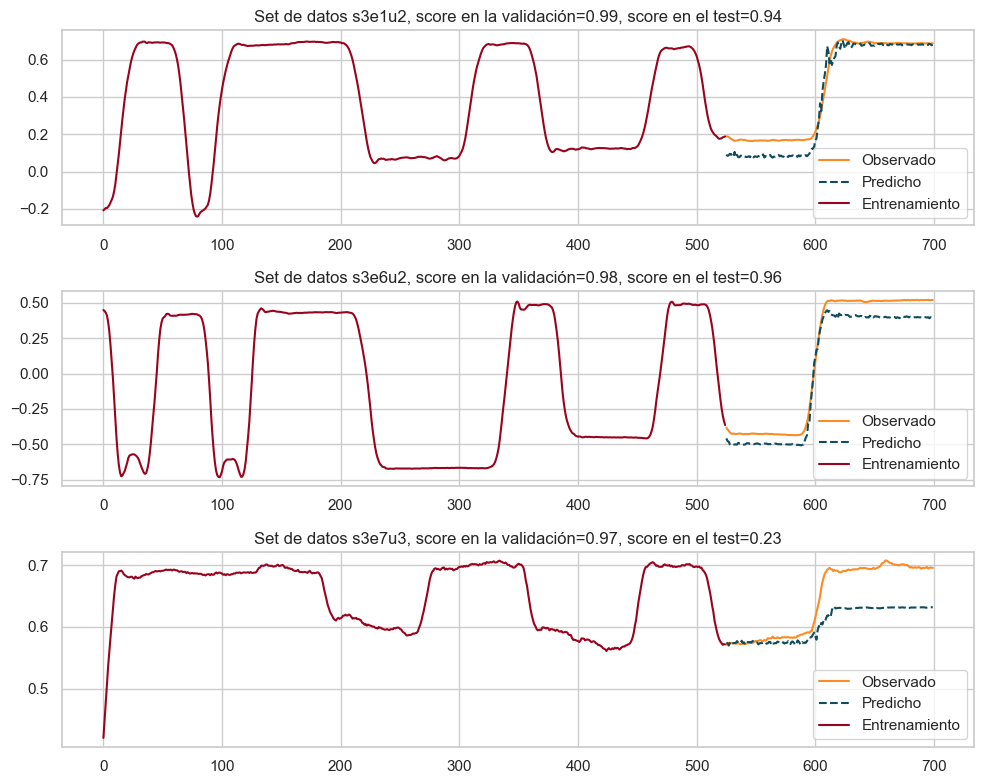

In [98]:
colores = ['#9A031E', '#FB8B24', '#0F4C5C'] 
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 1, figsize=(10,8))

for i, (k, datos) in enumerate(graficas.items()):
    obs = datos["obs"]
    predic = datos["predic"]
    yTrain = datos["train"]
    '''n_estimators = datos["parametro_n_estimators"]
    max_depth = datos["parametro_max_depth"]'''
    score = datos['score']
    scoreTest = datos['scoreTest']

    ax = axes[i]
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(obs)), y=obs, label=f"Observado", color="#FB8B24", ax=ax)
    sns.lineplot(x=range(len(yTrain), len(yTrain) + len(predic)), y=predic, label=f"Predicho", color="#0F4C5C", linestyle="--", ax=ax)
    sns.lineplot(x=range(len(yTrain)), y=yTrain, label="Entrenamiento", color="#9A031E", ax=ax)
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"Set de datos {k}, score en la validación={round(score, 2)}, score en el test={round(scoreTest, 2)}")
    ax.legend()

plt.tight_layout()
plt.show()


En la figura anterior se muestra como las predicciones siguen a los datos reales, aunque se pueden ver que estas no son tan precisos como se esperaría para un score de 96% aproximadamente, aun así las predicciones siguen siendo muy buenas predicciones.

Veamos como se comportan los residuos.

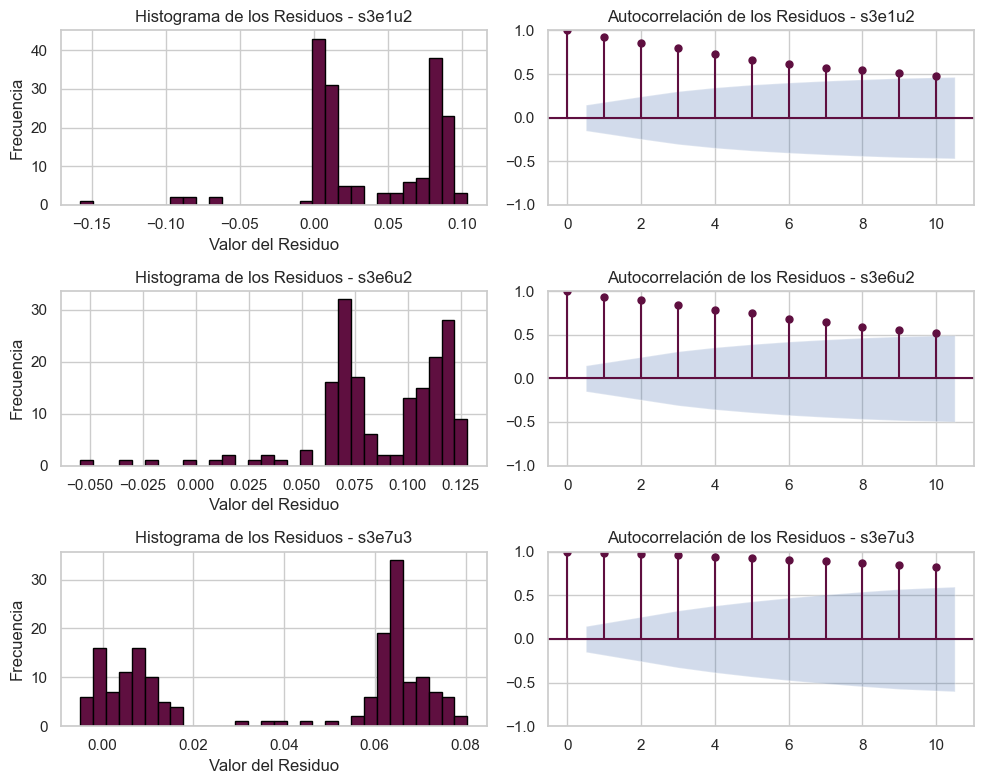

In [99]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8))  

for i, (k, datos) in enumerate(graficas.items()):
    residuo = datos["residual"]
    ax_hist = axes[i, 0]  
    ax_acf = axes[i, 1]   

    ax_hist.hist(residuo, bins=30, color='#5F0F40', edgecolor='black')
    ax_hist.set_title(f"Histograma de los Residuos - {k}")
    ax_hist.set_xlabel("Valor del Residuo")
    ax_hist.set_ylabel("Frecuencia")

    sm.graphics.tsa.plot_acf(residuo, lags=10, ax=ax_acf, color='#5F0F40', vlines_kwargs={'color': '#5F0F40'}, alpha=0.05)
    ax_acf.set_title(f"Autocorrelación de los Residuos - {k}")

plt.tight_layout()
plt.show()

Se confirma tambien para estos modelo de SVR que no se cumplen los supuestos de los residuos, se ve claramente que existe un patrón en la correlación de los residuos y en los histogramas no se ve la forma de una distribución normal.

## **Conclusiones**

Mejores modelos por variable respuesta:

In [104]:
mejores_modelo_xvar = pd.concat([
    tabla_mejores.head(1),
    tabla_mejores_ridge.head(1),
    tabla_mejores_lasso.head(1),
    tabla_mejores_regresionlineal.head(1),
    tabla_mejores_rf.head(1),
    tabla_mejores_xgb.head(1),
    tabla_mejores_svr.head(1)
], ignore_index=True)

variables=['acc_x','acc_y','acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'mag_x']
mejores_modelo_xvar['variable respuesta']=variables

mejores_modelo_xvar=mejores_modelo_xvar.sort_values(by='R2', ascending=False)
mejores_modelo_xvar

,,Data,Parametro,MAPE,MAE,RMSE,MSE,R2,R2_val,LJung-Box p-value,Jarque-Bera p-value,variable respuesta
0,K-NN,s3e2u4,45,0.011010,0.099071,0.135726,0.018421,0.950471,0.928752,1.793522e-21,6.867581e-08,acc_x
6,SVR,s3e1u2,10,0.233476,0.046841,0.060253,0.003630,0.942769,0.988647,5.912890e-35,5.307408e-08,mag_x
4,Random Forest,s3e6u2,100,8.701748,0.088692,0.149515,0.022355,0.927680,0.961785,1.591554e-19,0.000000e+00,gyr_y
1,Ridge,s3e4u1,0.1,0.022073,0.058483,0.087331,0.007627,0.889493,0.966987,4.311415e-01,0.000000e+00,acc_y
5,XGBoost,s3e1u2,100,18.871422,0.072236,0.143361,0.020552,0.846854,0.969331,1.014971e-24,0.000000e+00,gyr_z
2,Lasso,s3e2u4,0.1,1.799939,1.178578,1.260495,1.588848,0.728357,0.929745,4.602443e-29,8.677032e-24,acc_z
3,Regresión lineal,s3e1u3,,2.201483,0.050850,0.083244,0.006930,0.056884,0.618867,5.451539e-24,7.095593e-43,gyr_x


La tabla anterior muesta los mejores modelos para cada una de las variables escogidas para ser predichas. De manera general, podemos ver que el mejor modelo en términos del score en el conjunto de test fue el *knn* el cual era el encargado de predecir la variable `acc_x`, con un score de 95%. Este modelo tiene errores bastante pequeños, recordemos que el mejor parámetro fue $k=45$. Siguiéndole de manera muy cercana, está el modelo *SVR* este era el encargado de predecir la variable `mag_x` con el parámetro $C=10$ y un kernel radial. El modelo con menor rendimiento a nivel del score en el conjunto de test fue el modelo lineal con un score en el test de 5.6% y un sobreajuste bastante grande, lo cual era de esperarse, ya que este modelo tiende a sobreajustarse. Por esta razón, el modelo Ridge está mejor ubicado en la tabla, como el cuarto mejor modelo, pues este con el factor de regularización evita el sobreajuste y mejora el score en el test. Hablando de los residuos de estos modelos queda la inquietud de que ninguno de ellos cumplió con los supuestos de normalidad e independencia; este comportamiento se podría estudiar más a profundidad.